In [7]:
audio_path = "C:\\Users\\Thomas\\Desktop\\PhD\\data\\Media1.wav"

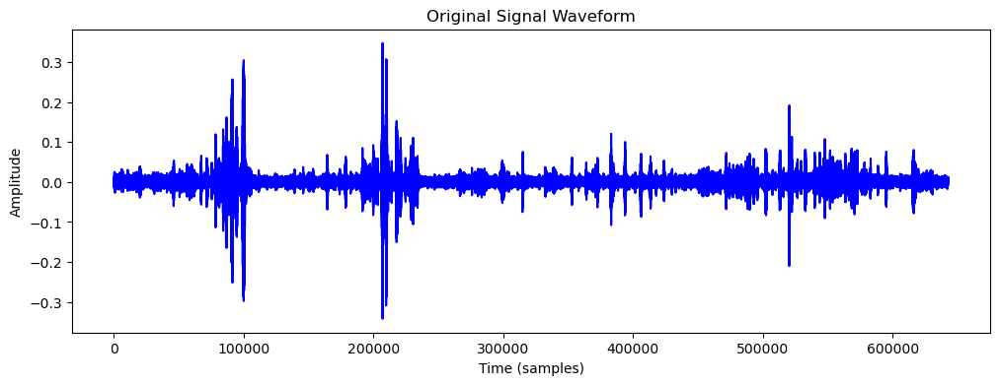

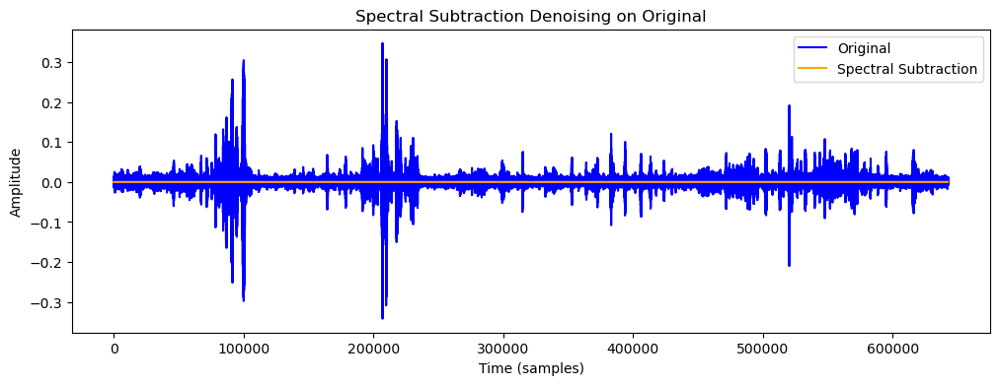

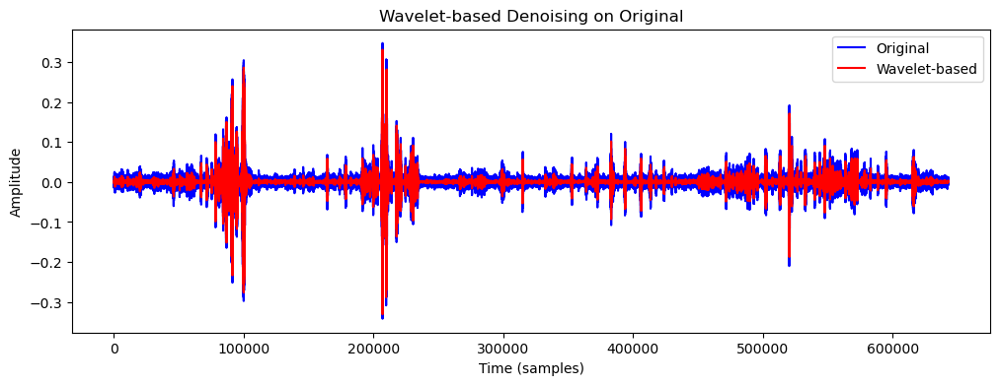

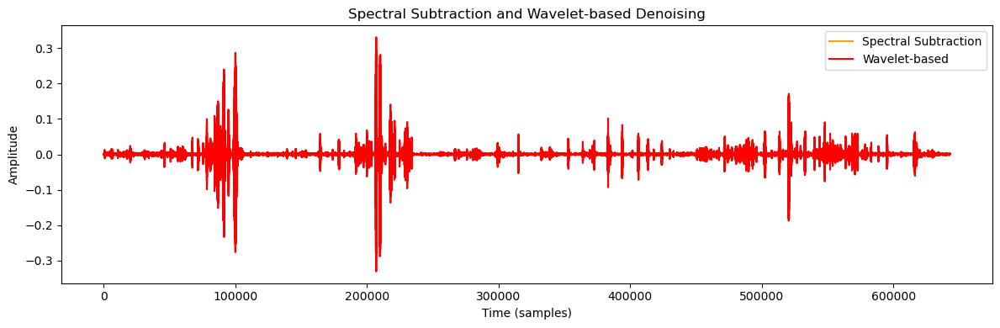

In [9]:
import librosa
import librosa.display
import numpy as np
import matplotlib.pyplot as plt
import pywt  # Wavelet transformation package

# Load the provided audio file
audio_file, sr = librosa.load(audio_path, sr=None)

# Spectral Subtraction Denoising
noise_estimate = np.abs(librosa.stft(audio_file))**2
alpha = 2
spectrogram_denoised = np.abs(librosa.stft(audio_file))**2 - alpha * noise_estimate
audio_file_denoised_spectral = librosa.istft(np.sqrt(np.maximum(spectrogram_denoised, 0)) * np.exp(1j * np.angle(librosa.stft(audio_file))))

# Wavelet-based Denoising
coeffs = pywt.wavedec(audio_file, 'db1')  # Decomposition with Daubechies wavelet
threshold = np.sqrt(2 * np.log(len(audio_file))) * np.median(np.abs(coeffs[-1])) / 0.6745
coeffs_thresholded = list(map(lambda x: pywt.threshold(x, threshold, mode='soft'), coeffs))
audio_file_denoised_wavelet = pywt.waverec(coeffs_thresholded, 'db1')

# Plotting the waveforms
plt.figure(figsize=(12, 4))

# Original waveform
plt.plot(audio_file, color='blue')
plt.title('Original Signal Waveform')
plt.xlabel('Time (samples)')
plt.ylabel('Amplitude')

# Spectral Subtraction Denoising overlayed on Original
plt.figure(figsize=(12, 4))
plt.plot(audio_file, color='blue', label='Original')
plt.plot(audio_file_denoised_spectral, color='orange', label='Spectral Subtraction')
plt.title('Spectral Subtraction Denoising on Original')
plt.xlabel('Time (samples)')
plt.ylabel('Amplitude')
plt.legend()

# Wavelet-based Denoising overlayed on Original
plt.figure(figsize=(12, 4))
plt.plot(audio_file, color='blue', label='Original')
plt.plot(audio_file_denoised_wavelet, color='red', label='Wavelet-based')
plt.title('Wavelet-based Denoising on Original')
plt.xlabel('Time (samples)')
plt.ylabel('Amplitude')
plt.legend()

# Spectral Subtraction below Wavelet-based
plt.figure(figsize=(12, 4))
plt.plot(audio_file_denoised_spectral, color='orange', label='Spectral Subtraction')
plt.plot(audio_file_denoised_wavelet, color='red', label='Wavelet-based')
plt.title('Spectral Subtraction and Wavelet-based Denoising')
plt.xlabel('Time (samples)')
plt.ylabel('Amplitude')
plt.legend()

plt.tight_layout()
plt.show()


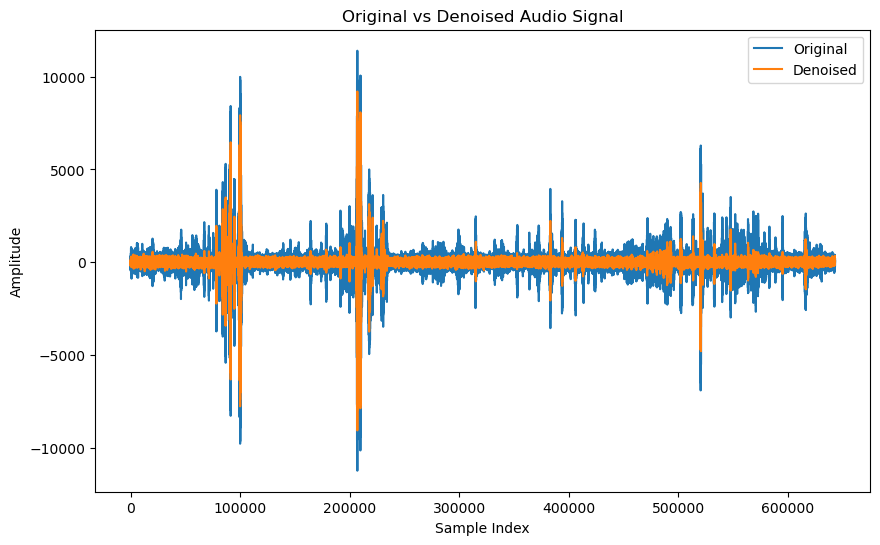

In [10]:
import numpy as np
import scipy.io.wavfile as wavfile
import pywt

# Load audio file
rate, data = wavfile.read(audio_path)

# Define the wavelet and level of decomposition
wavelet = 'db4'
level = 4

# Decompose the audio signal using wavelet transform
coeffs = pywt.wavedec(data, wavelet, level=level)

# Set the threshold as a multiple of the standard deviation of the highest frequency subband
threshold = 3*np.std(coeffs[-1])

# Apply spectral subtraction by setting all coefficients below the threshold to zero
coeffs[1:] = (pywt.threshold(i, value=threshold, mode='soft') for i in coeffs[1:])

# Reconstruct the denoised audio signal
denoised = pywt.waverec(coeffs, wavelet)

# Plot the original and denoised audio signals
import matplotlib.pyplot as plt
plt.figure(figsize=(10, 6))
plt.plot(data, label='Original')
plt.plot(denoised, label='Denoised')
plt.xlabel('Sample Index')
plt.ylabel('Amplitude')
plt.title('Original vs Denoised Audio Signal')
plt.legend()
plt.show()


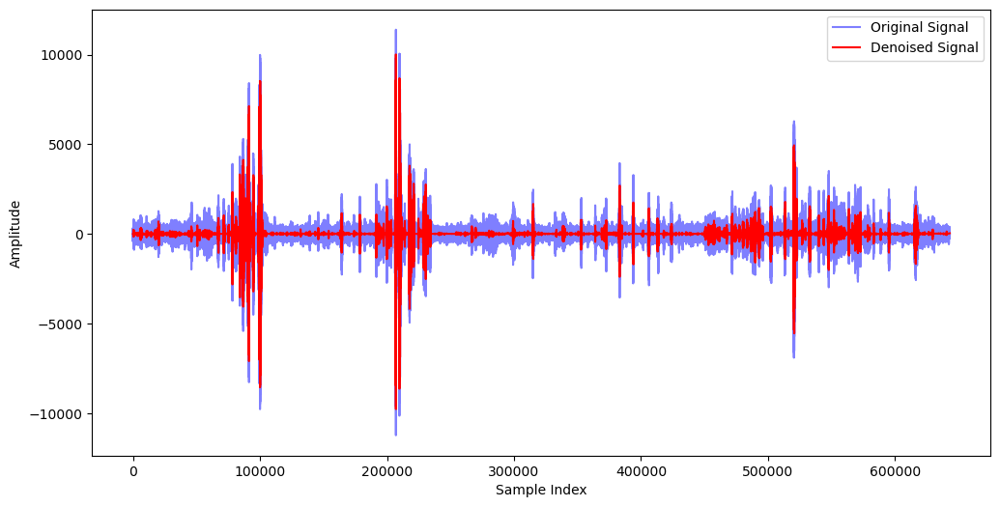

In [11]:
import pywt
import numpy as np
import scipy.io.wavfile as wavfile
import matplotlib.pyplot as plt

# Load audio file
rate, data = wavfile.read(audio_path)
signal_length = len(data)

# Define wavelet function and decomposition level
wavelet = 'db4'
level = pywt.dwt_max_level(signal_length, wavelet)

# Perform wavelet decomposition and noise thresholding
coeffs = pywt.wavedec(data, wavelet, level=level)
threshold = np.sqrt(2 * np.log(signal_length)) * np.median(np.abs(coeffs[-level]))
coeffs[1:] = (pywt.threshold(c, threshold) for c in coeffs[1:])
denoised_signal = pywt.waverec(coeffs, wavelet)

# Plot original and denoised signals
plt.figure(figsize=(12, 6))
plt.plot(data, color='blue', alpha=0.5, label='Original Signal')
plt.plot(denoised_signal, color='red', label='Denoised Signal')
plt.legend()
plt.xlabel('Sample Index')
plt.ylabel('Amplitude')
plt.show()

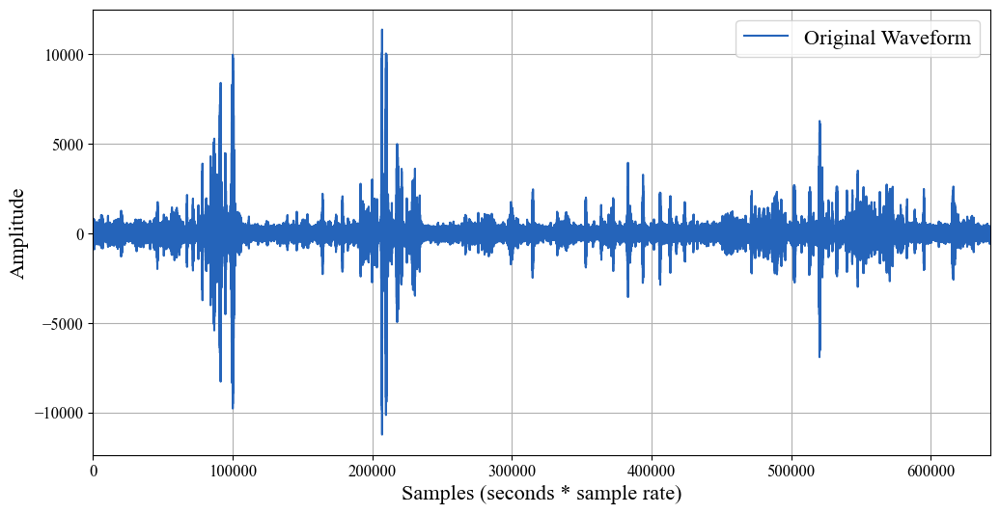

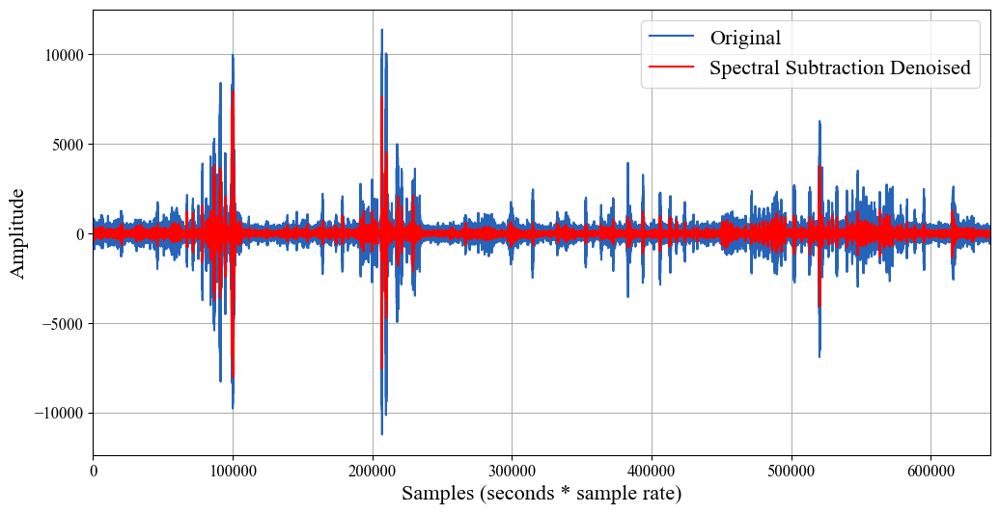

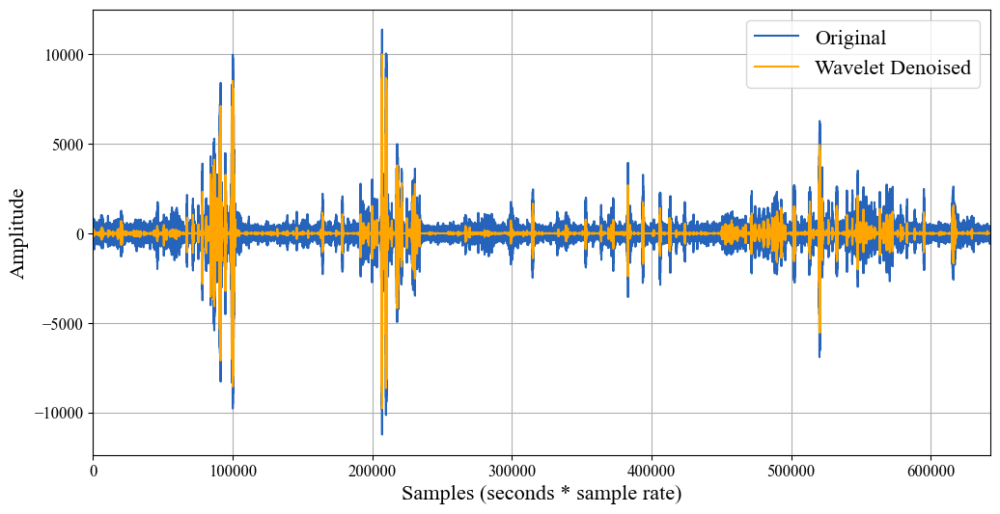

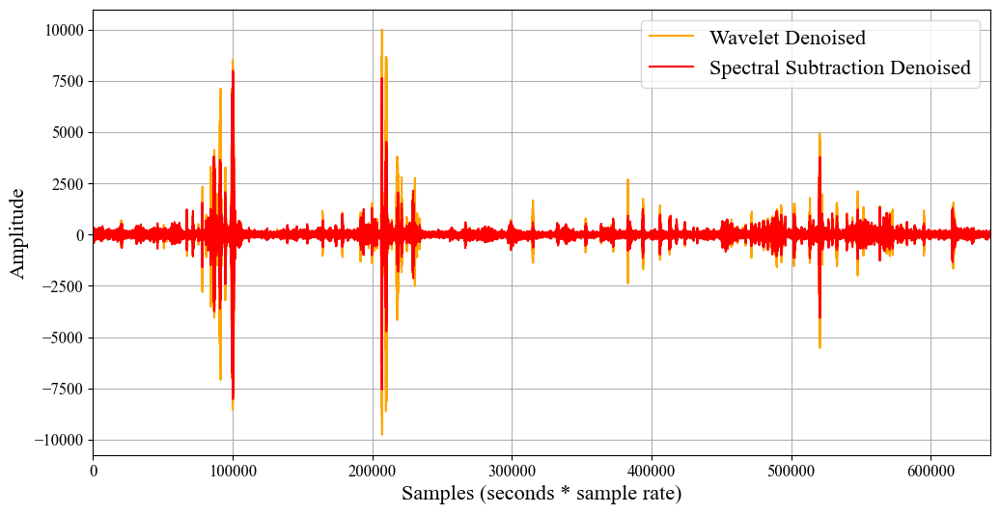

In [3]:
from tkinter import font
import scipy.io.wavfile as wav
import numpy as np
import matplotlib.pyplot as plt
from scipy.signal import stft, istft
import pywt
import matplotlib as mpl

# Load the audio file
audio_path = "C:\\Users\\Thomas\\Desktop\\PhD\\data\\Media1.wav"
output = "C:\\Users\\Thomas\\Desktop\PhD\\Survey paper\\Updated-Updated Images\\"
fs, data = wav.read(audio_path)

# Define the STFT parameters
window = 'hann'
nperseg = 256
noverlap = nperseg // 2
nfft = nperseg

# Perform the STFT
f, t, Zxx = stft(data, fs=fs, window=window, nperseg=nperseg, noverlap=noverlap, nfft=nfft)

# Calculate the power spectrum
Pxx = np.abs(Zxx) ** 2

# Calculate the noise floor
noise_power = np.median(Pxx, axis=1)

# Set the spectral floor threshold
alpha = 1

# Apply spectral subtraction
Pxx_denoised = np.maximum(Pxx - alpha * noise_power[:, np.newaxis], 0)

# Invert the STFT to obtain the denoised signal
_, x_denoised_spectral = istft(np.sqrt(Pxx_denoised), fs=fs, window=window, nperseg=nperseg, noverlap=noverlap, nfft=nfft)

# Perform wavelet decomposition and noise thresholding for Wavelet denoising
wavelet = 'db4'
level = pywt.dwt_max_level(len(data), wavelet)
coeffs = pywt.wavedec(data, wavelet, level=level)
threshold = np.sqrt(2 * np.log(len(data))) * np.median(np.abs(coeffs[-level]))
coeffs[1:] = (pywt.threshold(c, threshold) for c in coeffs[1:])
x_denoised_wavelet = pywt.waverec(coeffs, wavelet)

# Define the color palette
oxford_blue = "#2564ba"
denoised_color_spectral = "red"
denoised_color_wavelet = "orange"


# Set the default font to Times New Roman
mpl.rcParams['font.family'] = 'serif'
mpl.rcParams['font.serif'] = 'Times New Roman'

# Set default font sizes
plt.rcParams['legend.fontsize'] = 16  # Sets the font size for legends
plt.rcParams['xtick.labelsize'] = 12  # Sets the font size for X tick labels
plt.rcParams['ytick.labelsize'] = 12  # Sets the font size for Y tick labels


# Plotting each waveform separately
plt.figure(figsize=(12, 6))
plt.plot(data, color=oxford_blue, label='Original Waveform')
plt.xlim(0, len(data))  # Set the x-axis limits
plt.xlabel('Samples (seconds * sample rate)', fontsize=16)
plt.ylabel('Amplitude', fontsize=16)
plt.grid(True)
plt.legend()
#plt.show()
plt.savefig(output + "fig1.png", dpi=1200)

plt.figure(figsize=(12, 6))
plt.plot(data, color=oxford_blue, label='Original')
plt.plot(x_denoised_spectral, color=denoised_color_spectral, label='Spectral Subtraction Denoised')
plt.legend()
plt.xlim(0, len(data))  # Set the x-axis limits
plt.xlabel('Samples (seconds * sample rate)', fontsize=16, )
plt.ylabel('Amplitude', fontsize=16)
plt.grid(True)
#plt.show()
plt.savefig(output + "fig2.png", dpi=1200)

plt.figure(figsize=(12, 6))
plt.plot(data, color=oxford_blue, label='Original')
plt.plot(x_denoised_wavelet, color=denoised_color_wavelet, label='Wavelet Denoised')
plt.legend()
plt.xlim(0, len(data))  # Set the x-axis limits
plt.xlabel('Samples (seconds * sample rate)', fontsize=16)
plt.ylabel('Amplitude', fontsize=16)
plt.grid(True)
#plt.show()
plt.savefig(output + "fig3.png", dpi=1200)

plt.figure(figsize=(12, 6))
plt.plot(x_denoised_wavelet, color=denoised_color_wavelet, label='Wavelet Denoised')
plt.plot(x_denoised_spectral, color=denoised_color_spectral, label='Spectral Subtraction Denoised')
plt.legend()
plt.xlim(0, len(data))  # Set the x-axis limits
plt.xlabel('Samples (seconds * sample rate)', fontsize=16)
plt.ylabel('Amplitude', fontsize=16)
plt.grid(True)
#plt.show()
plt.savefig(output + "fig4.png", dpi=1200)




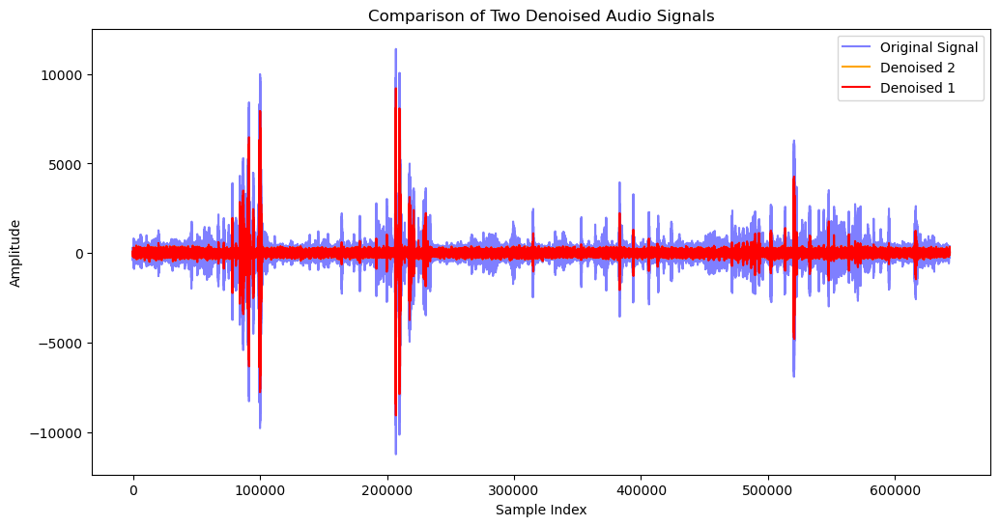

In [12]:
import numpy as np
import scipy.io.wavfile as wavfile
import pywt
import matplotlib.pyplot as plt

# Load audio file
rate, data = wavfile.read(audio_path)


# Define the wavelet and level of decomposition
wavelet = 'db4'
level = 4

# Decompose the audio signal using wavelet transform for the first denoising
coeffs = pywt.wavedec(data, wavelet, level=level)

# Set the threshold as a multiple of the standard deviation of the highest frequency subband
threshold = 3 * np.std(coeffs[-1])

# Apply spectral subtraction by setting all coefficients below the threshold to zero
coeffs[1:] = (pywt.threshold(i, value=threshold, mode='soft') for i in coeffs[1:])

# Reconstruct the first denoised audio signal
denoised1 = pywt.waverec(coeffs, wavelet)

# Perform another denoising (you can adjust the parameters as needed)
coeffs2 = pywt.wavedec(denoised1, wavelet, level=level)
threshold2 = 3 * np.std(coeffs2[-1])
coeffs2[1:] = (pywt.threshold(i, value=threshold2, mode='soft') for i in coeffs2[1:])
denoised2 = pywt.waverec(coeffs2, wavelet)

# Plot the two denoised audio signals with different colors
plt.figure(figsize=(12, 6))
plt.plot(data, color='blue', alpha=0.5, label='Original Signal')
plt.plot(denoised2, label='Denoised 2', color='orange')
plt.plot(denoised1, label='Denoised 1', color='red')
plt.xlabel('Sample Index')
plt.ylabel('Amplitude')
plt.title('Comparison of Two Denoised Audio Signals')
plt.legend()
plt.show()


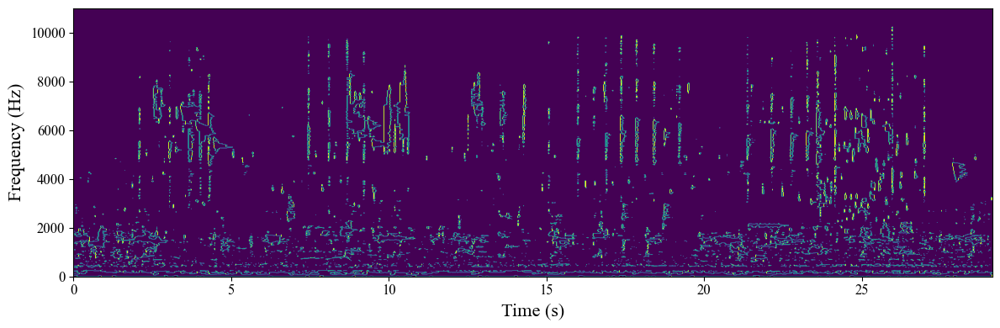

In [34]:
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np
from scipy import signal
import matplotlib as mpl

# Load the .wav file
audio_file, sr = librosa.load(audio_path, sr=None)

# Define the filter parameters
nyquist_freq = sr / 2.0
cutoff_freq_low = 2000.0
cutoff_freq_high = 8000.0
filter_order = 5

# Low-pass filter
b_low, a_low = signal.butter(filter_order, cutoff_freq_low / nyquist_freq, 'low')
audio_file_lowpass = signal.filtfilt(b_low, a_low, audio_file)

# Band-pass filter
b_band, a_band = signal.butter(filter_order, [cutoff_freq_low / nyquist_freq, cutoff_freq_high / nyquist_freq], 'band')
audio_file_bandpass = signal.filtfilt(b_band, a_band, audio_file)

# High-pass filter
b_high, a_high = signal.butter(filter_order, cutoff_freq_high / nyquist_freq, 'high')
audio_file_highpass = signal.filtfilt(b_high, a_high, audio_file)


import numpy as np
import matplotlib.pyplot as plt
import scipy.signal as signal
import cv2
import librosa

# Set the default font to Times New Roman
mpl.rcParams['font.family'] = 'serif'
mpl.rcParams['font.serif'] = 'Times New Roman'

# Set default font sizes
plt.rcParams['legend.fontsize'] = 16  # Sets the font size for legends
plt.rcParams['xtick.labelsize'] = 12  # Sets the font size for X tick labels
plt.rcParams['ytick.labelsize'] = 12  # Sets the font size for Y tick labels

# Load the audio file
y, sr = librosa.load(audio_path, sr=None)

# Compute spectrogram
S = librosa.stft(y)
Sdb = librosa.amplitude_to_db(np.abs(S))

# Normalize values to range [0, 255]
Sdb_norm = cv2.normalize(Sdb, None, 0, 255, cv2.NORM_MINMAX)

# Convert to 8-bit unsigned integer
Sdb_uint8 = Sdb_norm.astype(np.uint8)

# Threshold spectrogram to extract bird calls
thresh_value = 100
thresh = cv2.threshold(Sdb_uint8, thresh_value, 255, cv2.THRESH_BINARY)[1]

# Perform morphological closing to fill gaps in bird calls
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
closed = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel)

# Find contours in spectrogram
contours, hierarchy = cv2.findContours(closed, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Draw contours on spectrogram
edges = np.zeros_like(Sdb_uint8)
cv2.drawContours(edges, contours, -1, (255, 255, 255), 1)

# Create x-axis and y-axis labels
time_bins = librosa.core.frames_to_time(np.arange(Sdb.shape[1]), sr=sr)
freq_bins = librosa.core.fft_frequencies(n_fft=S.shape[0])

# Display output image with labels

plt.figure(figsize=(12, 4))
plt.imshow(edges, aspect='auto', origin='lower',
           extent=[time_bins[0], time_bins[-1], freq_bins[0], freq_bins[-1]])
plt.xlabel('Time (s)', fontsize=16)
plt.ylabel('Frequency (Hz)', fontsize=16)
plt.tight_layout()
plt.savefig(output + "fig4.png", dpi=1200)

AttributeError: module 'matplotlib' has no attribute 'axes'

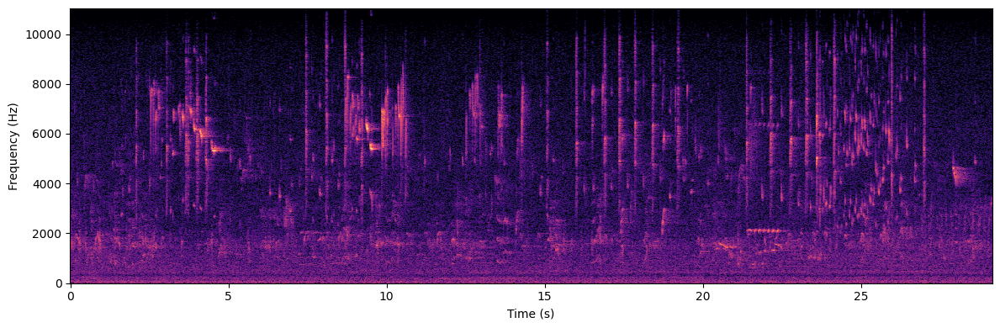

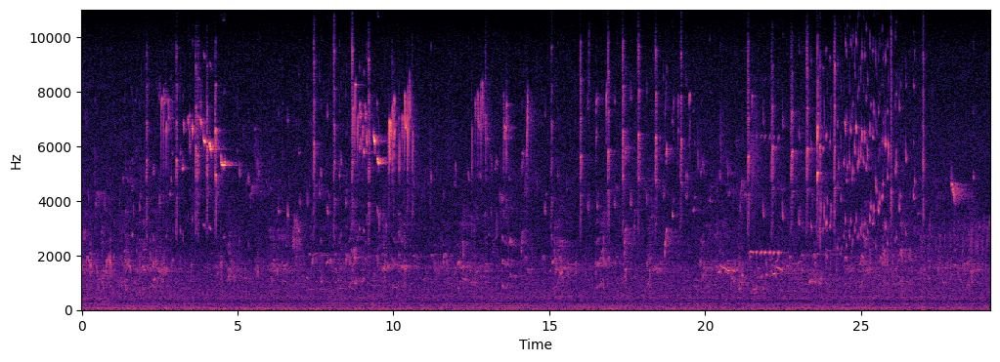

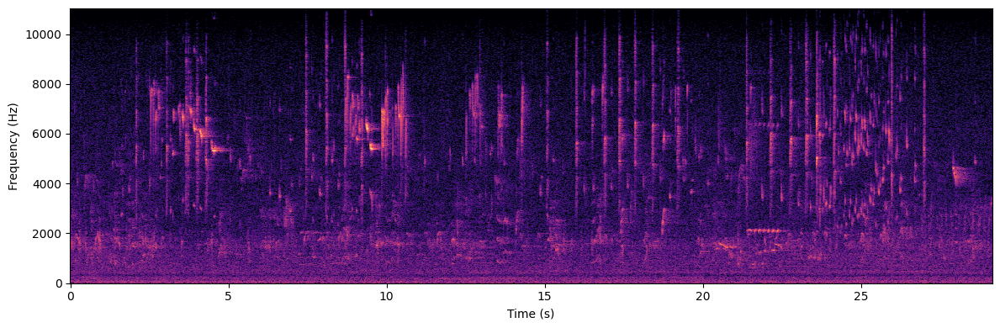

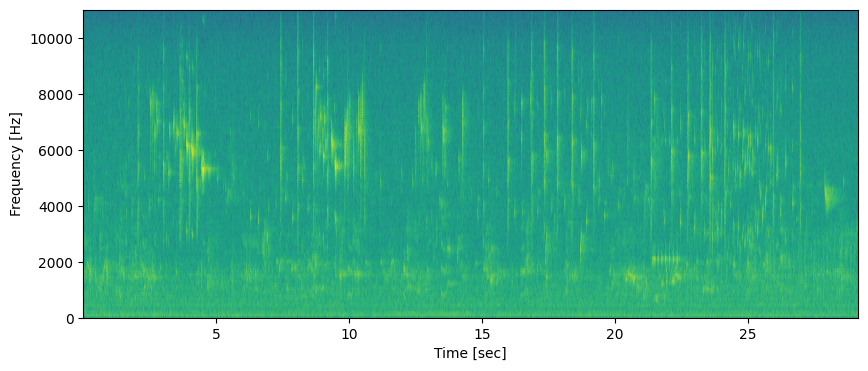

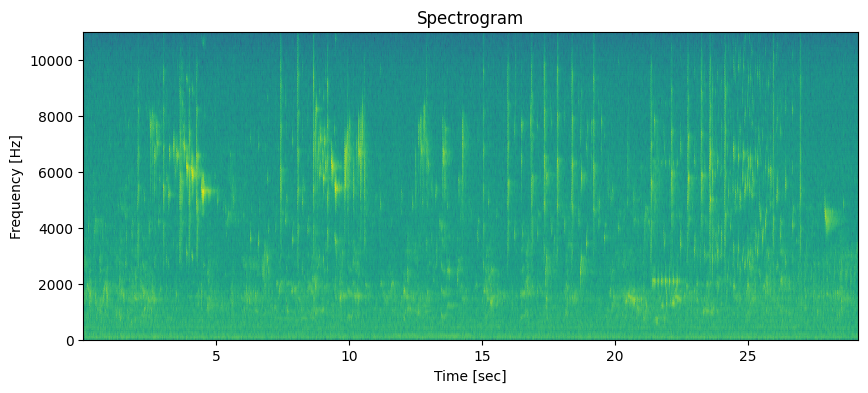

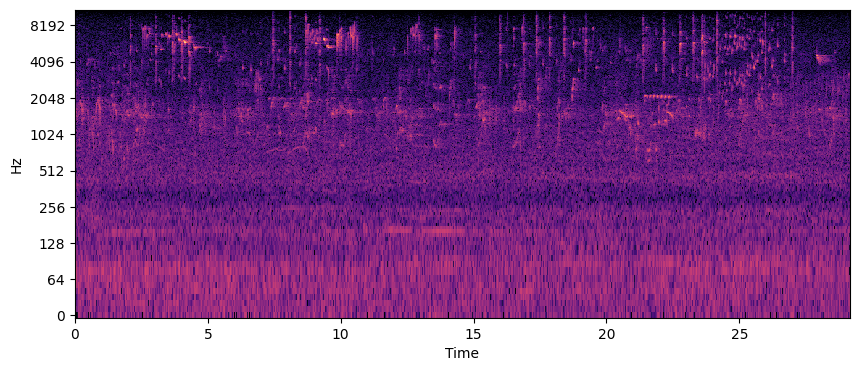

<Figure size 1000x400 with 0 Axes>

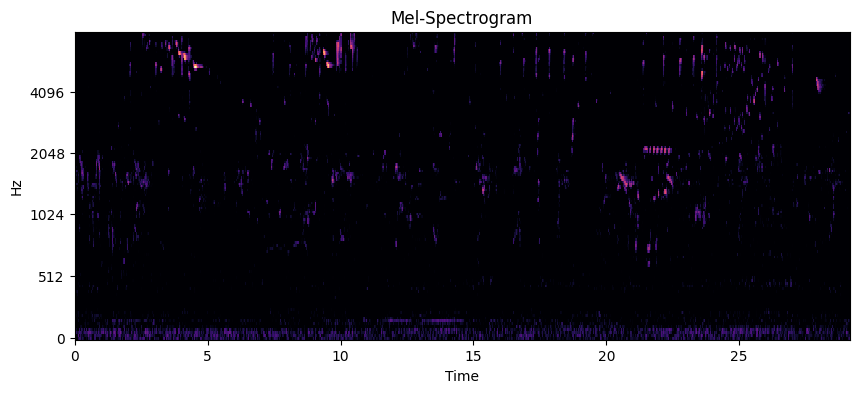

<Figure size 1000x800 with 0 Axes>

AttributeError: module 'matplotlib' has no attribute 'pyplot'

In [11]:
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np

# Load the audio file
audio, sr = librosa.load(audio_path, sr=None)

# Generate the spectrogram
S = librosa.stft(audio)
Xdb = librosa.amplitude_to_db(abs(S))

# Generate the Mel spectrogram
mel_spec = librosa.feature.melspectrogram(y=audio, sr=sr, n_mels=128)
mel_spec_db = librosa.power_to_db(mel_spec, ref=np.max)

# Plotting
fig, ax = plt.subplots(nrows=2, ncols=1, figsize=(10, 8))

# Display Spectrogram
librosa.display.specshow(Xdb, sr=sr, x_axis='time', y_axis='log', ax=ax[0])
ax[0].set_title('Spectrogram')
ax[0].set_xlabel('Time (s)')
ax[0].set_ylabel('Frequency (Hz)')

# Display Mel Spectrogram
librosa.display.specshow(mel_spec_db, sr=sr, x_axis='time', y_axis='mel', ax=ax[1])
ax[1].set_title('Mel Spectrogram')
ax[1].set_xlabel('Time (s)')
ax[1].set_ylabel('Mel bands')

plt.tight_layout()
plt.show()


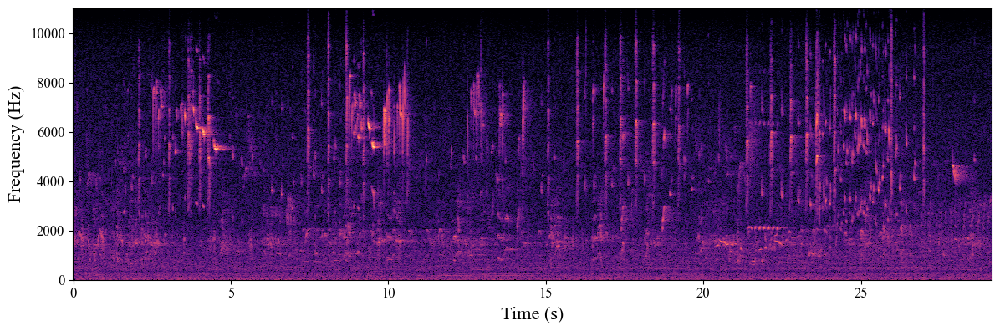

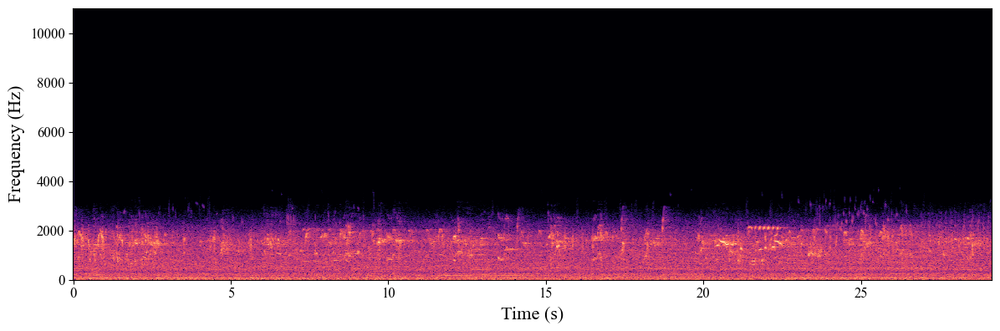

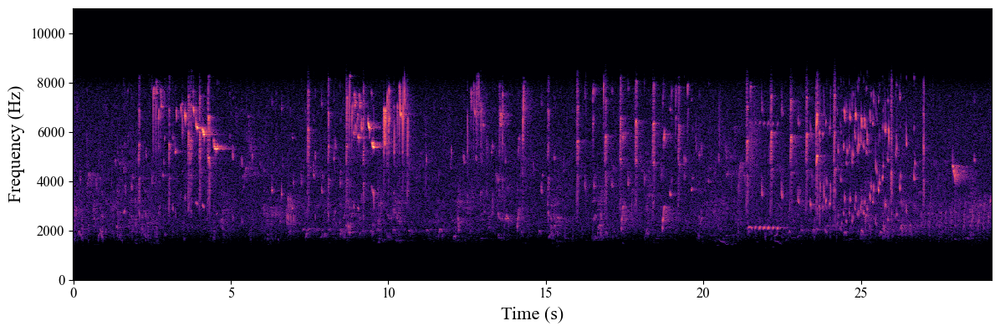

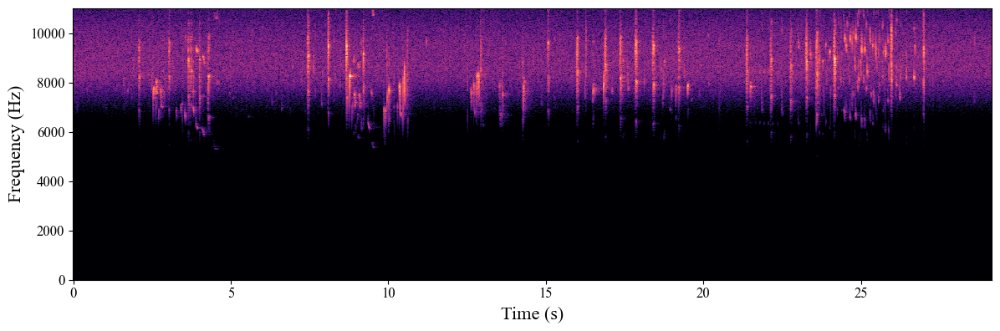

In [21]:
import librosa
import librosa.display
import matplotlib.pyplot as plt
import numpy as np
from scipy import signal

output = "C:\\Users\\Thomas\\Desktop\\PhD\\Survey paper\\Updated-Updated Images"
# Load the .wav file
audio_file, sr = librosa.load(audio_path, sr=None)

# Define the filter parameters
nyquist_freq = sr / 2.0
cutoff_freq_low = 2000.0
cutoff_freq_high = 8000.0
filter_order = 5

# Set the default font to Times New Roman
mpl.rcParams['font.family'] = 'serif'
mpl.rcParams['font.serif'] = 'Times New Roman'

# Set default font sizes
plt.rcParams['legend.fontsize'] = 16  # Sets the font size for legends
plt.rcParams['xtick.labelsize'] = 12  # Sets the font size for X tick labels
plt.rcParams['ytick.labelsize'] = 12  # Sets the font size for Y tick labels

# Low-pass filter
b_low, a_low = signal.butter(filter_order, cutoff_freq_low / nyquist_freq, 'low')
audio_file_lowpass = signal.filtfilt(b_low, a_low, audio_file)

# Band-pass filter
b_band, a_band = signal.butter(filter_order, [cutoff_freq_low / nyquist_freq, cutoff_freq_high / nyquist_freq], 'band')
audio_file_bandpass = signal.filtfilt(b_band, a_band, audio_file)

# High-pass filter
b_high, a_high = signal.butter(filter_order, cutoff_freq_high / nyquist_freq, 'high')
audio_file_highpass = signal.filtfilt(b_high, a_high, audio_file)

# Plot the spectrograms of the original and filtered signals
plt.figure(figsize=(12, 4))
librosa.display.specshow(librosa.amplitude_to_db(np.abs(librosa.stft(audio_file)), ref=np.max), sr=sr, x_axis='time', y_axis='linear')
plt.tight_layout()
plt.xlabel('Time (s)', fontsize=16)
plt.ylabel('Frequency (Hz)', fontsize=16)
# plt.show()
plt.savefig(output + "fig1.png", dpi=1200)

plt.figure(figsize=(12, 4))
librosa.display.specshow(librosa.amplitude_to_db(np.abs(librosa.stft(audio_file_lowpass)), ref=np.max), sr=sr, x_axis='time', y_axis='linear')
plt.tight_layout()
plt.xlabel('Time (s)', fontsize=16)
plt.ylabel('Frequency (Hz)', fontsize=16)
# plt.show()
plt.savefig(output + "fig2.png", dpi=1200)

plt.figure(figsize=(12, 4))
librosa.display.specshow(librosa.amplitude_to_db(np.abs(librosa.stft(audio_file_bandpass)), ref=np.max), sr=sr, x_axis='time', y_axis='linear')
plt.tight_layout()
plt.xlabel('Time (s)', fontsize=16)
plt.ylabel('Frequency (Hz)', fontsize=16)
# plt.show()
plt.savefig(output + "fig3.png", dpi=1200)

plt.figure(figsize=(12, 4))
librosa.display.specshow(librosa.amplitude_to_db(np.abs(librosa.stft(audio_file_highpass)), ref=np.max), sr=sr, x_axis='time', y_axis='linear')
plt.tight_layout()
plt.xlabel('Time (s)', fontsize=16)
plt.ylabel('Frequency (Hz)', fontsize=16)
# plt.show()
plt.savefig(output + "fig4.png", dpi=1200)

In [ ]:
%pip install cv2

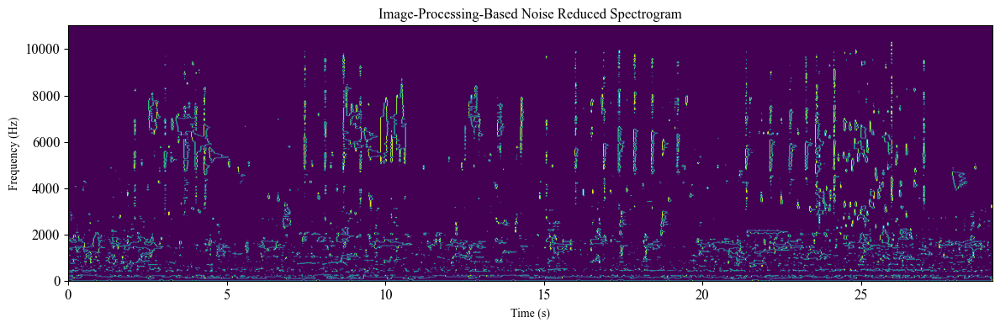

In [11]:
import numpy as np
import matplotlib.pyplot as plt
import scipy.signal as signal
import cv2
import librosa

# Load the audio file
y, sr = librosa.load(audio_path, sr=None)

# Compute spectrogram
S = librosa.stft(y)
Sdb = librosa.amplitude_to_db(np.abs(S))

# Normalize values to range [0, 255]
Sdb_norm = cv2.normalize(Sdb, None, 0, 255, cv2.NORM_MINMAX)

# Convert to 8-bit unsigned integer
Sdb_uint8 = Sdb_norm.astype(np.uint8)

# Threshold spectrogram to extract bird calls
thresh_value = 100
thresh = cv2.threshold(Sdb_uint8, thresh_value, 255, cv2.THRESH_BINARY)[1]

# Perform morphological closing to fill gaps in bird calls
kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (3, 3))
closed = cv2.morphologyEx(thresh, cv2.MORPH_CLOSE, kernel)

# Find contours in spectrogram
contours, hierarchy = cv2.findContours(closed, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)

# Draw contours on spectrogram
edges = np.zeros_like(Sdb_uint8)
cv2.drawContours(edges, contours, -1, (255, 255, 255), 1)

# Create x-axis and y-axis labels
time_bins = librosa.core.frames_to_time(np.arange(Sdb.shape[1]), sr=sr)
freq_bins = librosa.core.fft_frequencies(n_fft=S.shape[0])

# Display output image with labels
plt.figure(figsize=(12, 4))
plt.imshow(edges, aspect='auto', origin='lower',
           extent=[time_bins[0], time_bins[-1], freq_bins[0], freq_bins[-1]])
plt.xlabel('Time (s)')
plt.ylabel('Frequency (Hz)')
plt.tight_layout()
plt.savefig(output + "fig4.png", dpi=1200)

subplots

c:\Users\Thomas\conda\envs\audiohandling\lib\site-packages\librosa\core\spectrum.py:257: UserWarning: n_fft=2048 is too large for input signal of length=1000
  warnings.warn(


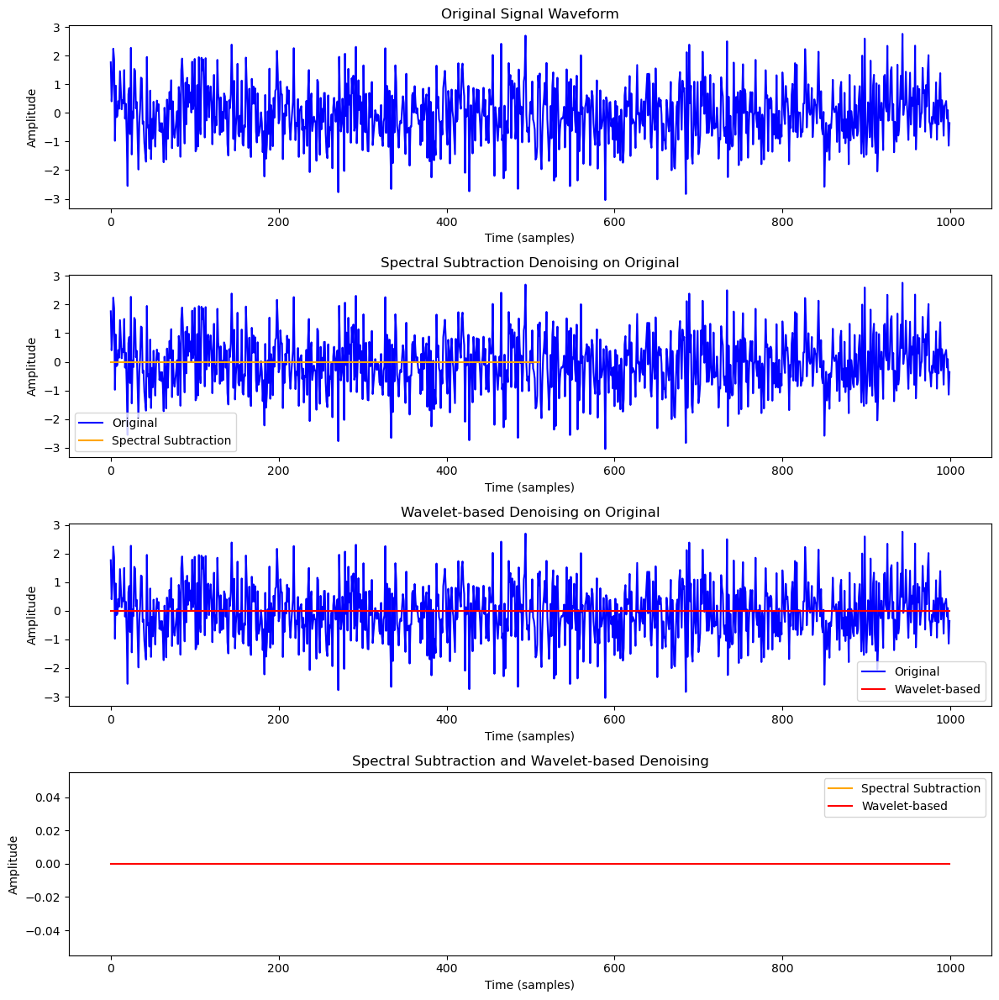

In [20]:
import librosa
import librosa.display
import numpy as np
import matplotlib.pyplot as plt
import pywt  # Wavelet transformation package

# Assuming 'audio_file' is already loaded and 'sr' (sample rate) is set
# For demonstration purposes, we'll simulate an audio file with random noise
np.random.seed(0)  # For reproducibility
audio_file = np.random.normal(0, 1, 1000)  # Simulated audio signal
sr = 22050  # Sample rate

# Spectral Subtraction Denoising
noise_estimate = np.abs(librosa.stft(audio_file))**2
alpha = 2
spectrogram_denoised = np.abs(librosa.stft(audio_file))**2 - alpha * noise_estimate
audio_file_denoised_spectral = librosa.istft(np.sqrt(np.maximum(spectrogram_denoised, 0)) * np.exp(1j * np.angle(librosa.stft(audio_file))))

# Wavelet-based Denoising
coeffs = pywt.wavedec(audio_file, 'db1')  # Decomposition with Daubechies wavelet
threshold = np.sqrt(2 * np.log(len(audio_file))) * np.median(np.abs(coeffs[-1])) / 0.6745
coeffs_thresholded = list(map(lambda x: pywt.threshold(x, threshold, mode='soft'), coeffs))
audio_file_denoised_wavelet = pywt.waverec(coeffs_thresholded, 'db1')

# Plotting the waveforms
plt.figure(figsize=(12, 12))

# Original waveform
plt.subplot(4, 1, 1)
plt.plot(audio_file, color='blue')
plt.title('Original Signal Waveform')
plt.xlabel('Time (samples)')
plt.ylabel('Amplitude')

# Spectral Subtraction Denoising overlayed on Original
plt.subplot(4, 1, 2)
plt.plot(audio_file, color='blue', label='Original')
plt.plot(audio_file_denoised_spectral, color='orange', label='Spectral Subtraction')
plt.title('Spectral Subtraction Denoising on Original')
plt.xlabel('Time (samples)')
plt.ylabel('Amplitude')
plt.legend()

# Wavelet-based Denoising overlayed on Original
plt.subplot(4, 1, 3)
plt.plot(audio_file, color='blue', label='Original')
plt.plot(audio_file_denoised_wavelet, color='red', label='Wavelet-based')
plt.title('Wavelet-based Denoising on Original')
plt.xlabel('Time (samples)')
plt.ylabel('Amplitude')
plt.legend()

# Spectral Subtraction below Wavelet-based
plt.subplot(4, 1, 4)
plt.plot(audio_file_denoised_spectral, color='orange', label='Spectral Subtraction')
plt.plot(audio_file_denoised_wavelet, color='red', label='Wavelet-based')
plt.title('Spectral Subtraction and Wavelet-based Denoising')
plt.xlabel('Time (samples)')
plt.ylabel('Amplitude')
plt.legend()

plt.tight_layout()
plt.show()


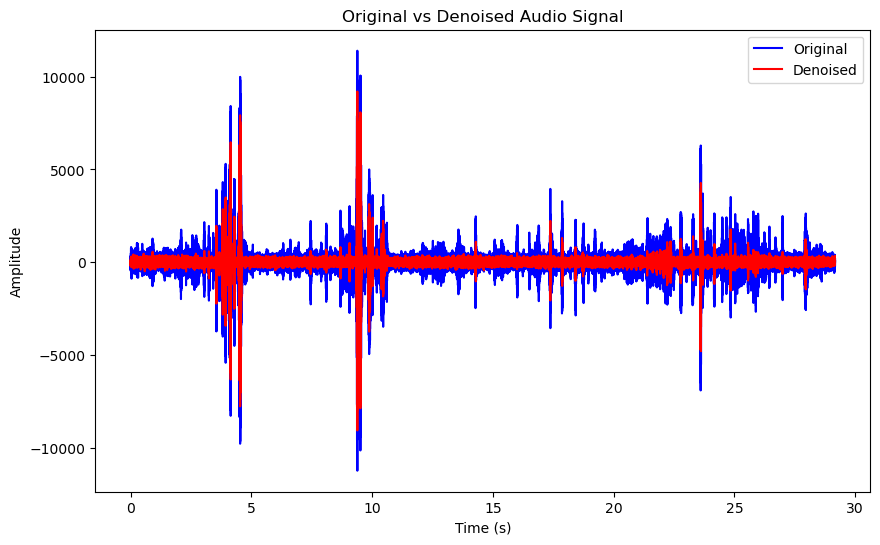

In [ ]:
import numpy as np
import scipy.io.wavfile as wavfile
import pywt
import matplotlib.pyplot as plt

# Load audio file
rate, data = wavfile.read(audio_path)

# Define the wavelet and level of decomposition
wavelet = 'db4'
level = 4

# Decompose the audio signal using wavelet transform
coeffs = pywt.wavedec(data, wavelet, level=level)

# Set the threshold as a multiple of the standard deviation of the highest frequency subband
threshold = 3 * np.std(coeffs[-1])

# Apply spectral subtraction by setting all coefficients below the threshold to zero
coeffs[1:] = (pywt.threshold(i, value=threshold, mode='soft') for i in coeffs[1:])

# Reconstruct the denoised audio signal
denoised = pywt.waverec(coeffs, wavelet)

# Create a time axis for the original signal
time_axis_original = np.arange(len(data)) / rate

# Create a time axis for the denoised signal (adjust its length to match the original)
time_axis_denoised = np.arange(len(denoised)) / rate

# Plot the original and denoised audio signals in one plot with different colors
plt.figure(figsize=(10, 6))
plt.plot(time_axis_original, data, label='Original', color='blue')
plt.plot(time_axis_denoised, denoised[:len(time_axis_denoised)], label='Denoised', color='red')
plt.xlabel('Time (s)')
plt.ylabel('Amplitude')
plt.title('Original vs Denoised Audio Signal')
plt.legend()
plt.show()


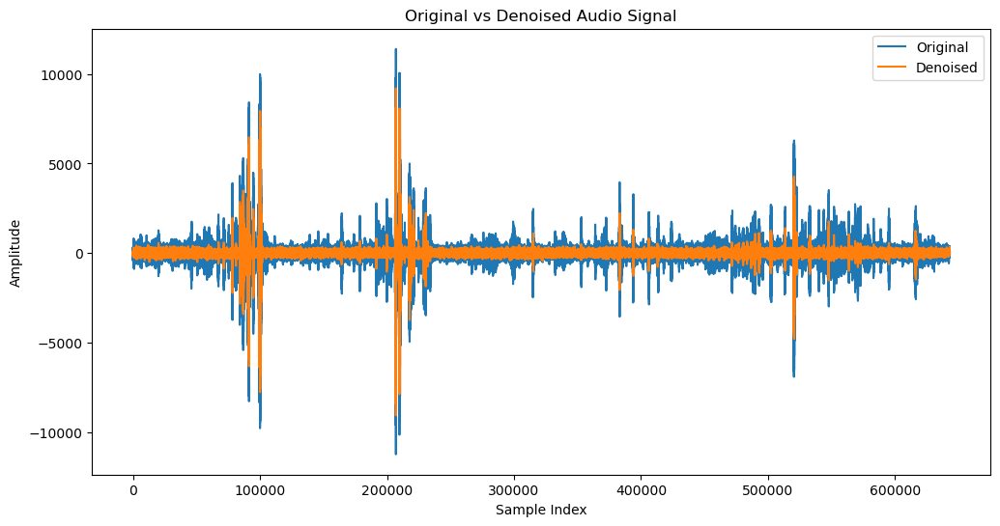

In [ ]:
import numpy as np
import scipy.io.wavfile as wavfile
import pywt

# Load audio file
rate, data = wavfile.read(audio_path)

# Define the wavelet and level of decomposition
wavelet = 'db4'
level = 4

# Decompose the audio signal using wavelet transform
coeffs = pywt.wavedec(data, wavelet, level=level)

# Set the threshold as a multiple of the standard deviation of the highest frequency subband
threshold = 3*np.std(coeffs[-1])

# Apply spectral subtraction by setting all coefficients below the threshold to zero
coeffs[1:] = (pywt.threshold(i, value=threshold, mode='soft') for i in coeffs[1:])

# Reconstruct the denoised audio signal
denoised = pywt.waverec(coeffs, wavelet)

# Plot the original and denoised audio signals
import matplotlib.pyplot as plt
plt.figure(figsize=(12, 6))
plt.plot(data, label='Original')
plt.plot(denoised, label='Denoised')
plt.xlabel('Sample Index')
plt.ylabel('Amplitude')
plt.title('Original vs Denoised Audio Signal')
plt.legend()
plt.show()

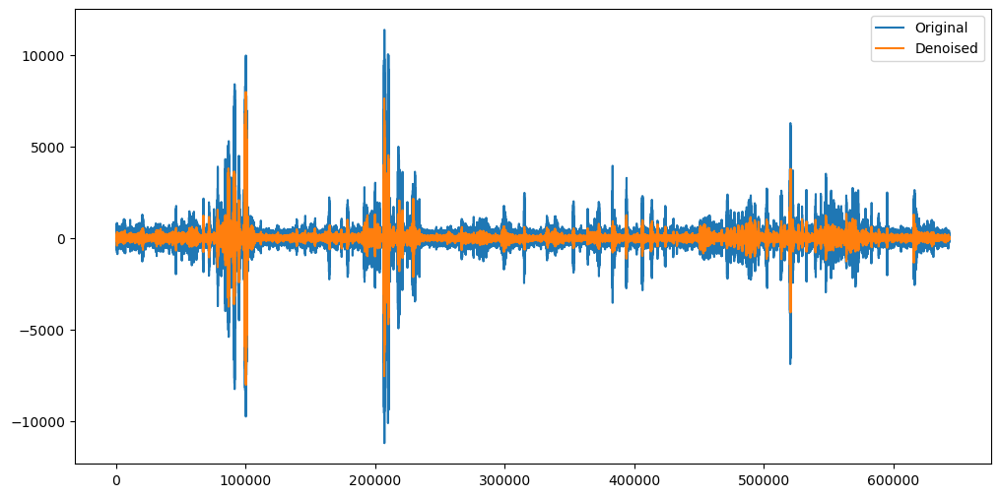

In [ ]:
import numpy as np
import scipy.io.wavfile as wav
from scipy.signal import stft, istft

fs, data = wav.read(audio_path)


# define the STFT parameters
window = 'hann'
nperseg = 256
noverlap = nperseg // 2
nfft = nperseg

# perform the STFT
f, t, Zxx = stft(data, fs=fs, window=window, nperseg=nperseg, noverlap=noverlap, nfft=nfft)

# calculate the power spectrum
Pxx = np.abs(Zxx) ** 2

# calculate the noise floor
noise_power = np.median(Pxx, axis=1)

# set the spectral floor threshold
alpha = 1

# apply spectral subtraction
Pxx_denoised = np.maximum(Pxx - alpha * noise_power[:, np.newaxis], 0)

# invert the STFT to obtain the denoised signal
_, x_denoised = istft(np.sqrt(Pxx_denoised), fs=fs, window=window, nperseg=nperseg, noverlap=noverlap, nfft=nfft)

# plot the original and denoised signals
import matplotlib.pyplot as plt
plt.figure(figsize=(12, 6))
plt.plot(data, label='Original')
plt.plot(x_denoised, label='Denoised')
plt.legend()
plt.show()

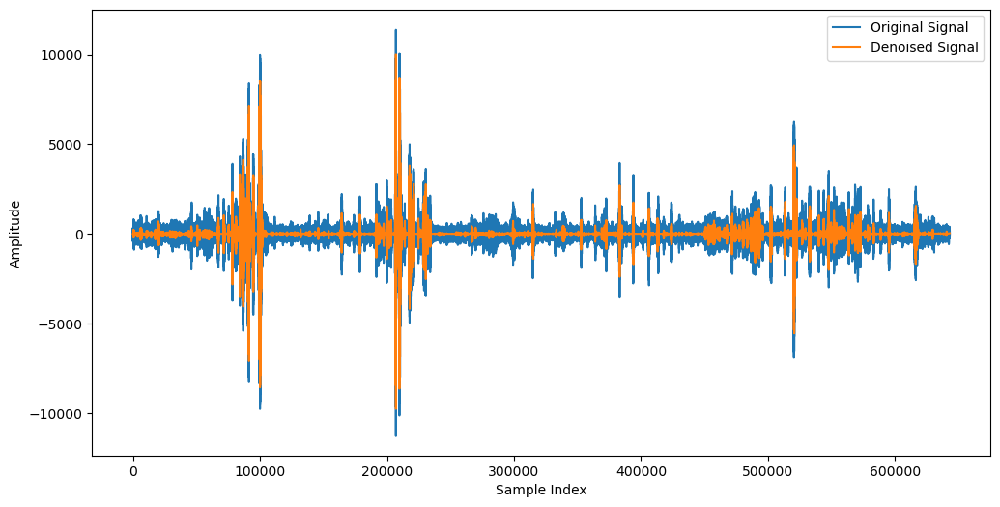

In [ ]:
import pywt
import numpy as np
import scipy.io.wavfile as wavfile
import matplotlib.pyplot as plt

# Load audio file
rate, data = wavfile.read(audio_path)
signal_length = len(data)

# Define wavelet function and decomposition level
wavelet = 'db4'
level = pywt.dwt_max_level(signal_length, wavelet)

# Perform wavelet decomposition and noise thresholding
coeffs = pywt.wavedec(data, wavelet, level=level)
threshold = np.sqrt(2 * np.log(signal_length)) * np.median(np.abs(coeffs[-level]))
coeffs[1:] = (pywt.threshold(c, threshold) for c in coeffs[1:])
denoised_signal = pywt.waverec(coeffs, wavelet)

# Plot original and denoised signals
plt.figure(figsize=(12, 6))
plt.plot(data, label='Original Signal')
plt.plot(denoised_signal, label='Denoised Signal')
plt.legend()
plt.xlabel('Sample Index')
plt.ylabel('Amplitude')
plt.show()

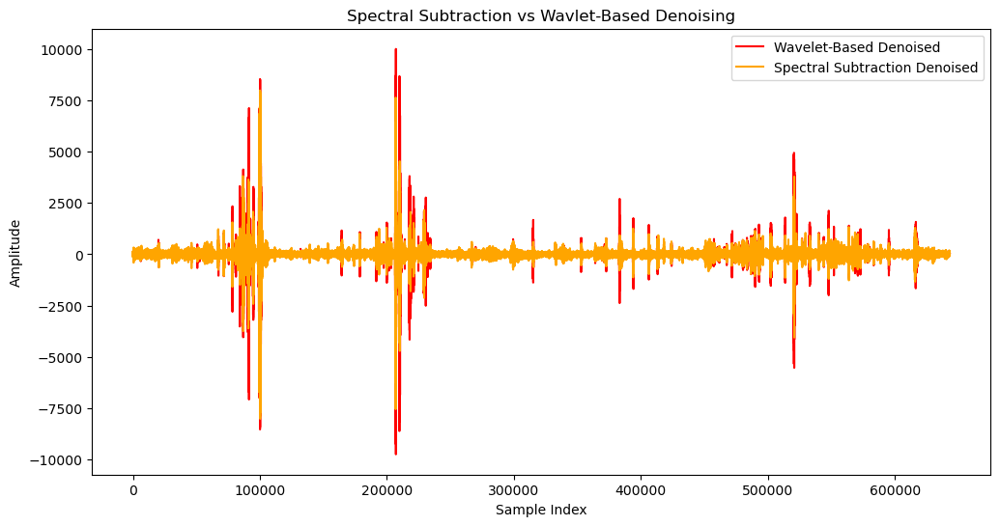

In [ ]:
import numpy as np
import scipy.io.wavfile as wav
from scipy.signal import stft, istft
import pywt
import matplotlib.pyplot as plt

fs, data = wav.read(audio_path)

# define the STFT parameters
window = 'hann'
nperseg = 256
noverlap = nperseg // 2
nfft = nperseg

# perform the STFT
f, t, Zxx = stft(data, fs=fs, window=window, nperseg=nperseg, noverlap=noverlap, nfft=nfft)

# calculate the power spectrum
Pxx = np.abs(Zxx) ** 2

# calculate the noise floor
noise_power = np.median(Pxx, axis=1)

# set the spectral floor threshold
alpha = 1

# apply spectral subtraction
Pxx_denoised = np.maximum(Pxx - alpha * noise_power[:, np.newaxis], 0)

# invert the STFT to obtain the denoised signal
_, x_denoised = istft(np.sqrt(Pxx_denoised), fs=fs, window=window, nperseg=nperseg, noverlap=noverlap, nfft=nfft)

# Load audio file for wavelet denoising
rate, data = wav.read(audio_path)
signal_length = len(data)

# Define wavelet function and decomposition level
wavelet = 'db4'
level = pywt.dwt_max_level(signal_length, wavelet)

# Perform wavelet decomposition and noise thresholding
coeffs = pywt.wavedec(data, wavelet, level=level)
threshold = np.sqrt(2 * np.log(signal_length)) * np.median(np.abs(coeffs[-level]))
coeffs[1:] = (pywt.threshold(c, threshold) for c in coeffs[1:])
denoised_signal = pywt.waverec(coeffs, wavelet)

# Plot both denoised signals and overlay them
plt.figure(figsize=(12, 6))
plt.title('Spectral Subtraction vs Wavlet-Based Denoising')
plt.plot(denoised_signal, label='Wavelet-Based Denoised', color='red')
plt.plot(x_denoised, label='Spectral Subtraction Denoised', color='orange')

plt.legend()
plt.xlabel('Sample Index')
plt.ylabel('Amplitude')
plt.show()


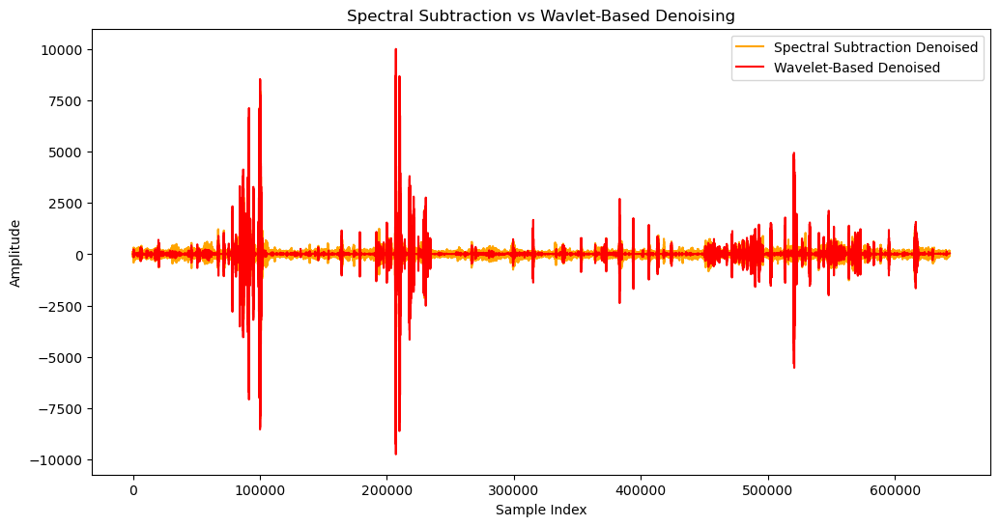

In [ ]:
import numpy as np
import scipy.io.wavfile as wav
from scipy.signal import stft, istft
import pywt
import matplotlib.pyplot as plt

fs, data = wav.read(audio_path)

# define the STFT parameters
window = 'hann'
nperseg = 256
noverlap = nperseg // 2
nfft = nperseg

# perform the STFT
f, t, Zxx = stft(data, fs=fs, window=window, nperseg=nperseg, noverlap=noverlap, nfft=nfft)

# calculate the power spectrum
Pxx = np.abs(Zxx) ** 2

# calculate the noise floor
noise_power = np.median(Pxx, axis=1)

# set the spectral floor threshold
alpha = 1

# apply spectral subtraction
Pxx_denoised = np.maximum(Pxx - alpha * noise_power[:, np.newaxis], 0)

# invert the STFT to obtain the denoised signal
_, x_denoised = istft(np.sqrt(Pxx_denoised), fs=fs, window=window, nperseg=nperseg, noverlap=noverlap, nfft=nfft)

# Load audio file for wavelet denoising
rate, data = wav.read(audio_path)
signal_length = len(data)

# Define wavelet function and decomposition level
wavelet = 'db4'
level = pywt.dwt_max_level(signal_length, wavelet)

# Perform wavelet decomposition and noise thresholding
coeffs = pywt.wavedec(data, wavelet, level=level)
threshold = np.sqrt(2 * np.log(signal_length)) * np.median(np.abs(coeffs[-level]))
coeffs[1:] = (pywt.threshold(c, threshold) for c in coeffs[1:])
denoised_signal = pywt.waverec(coeffs, wavelet)

# Plot both denoised signals and overlay them
plt.figure(figsize=(12, 6))
plt.title('Spectral Subtraction vs Wavlet-Based Denoising')

plt.plot(x_denoised, label='Spectral Subtraction Denoised', color='orange')
plt.plot(denoised_signal, label='Wavelet-Based Denoised', color='red')
plt.legend()
plt.xlabel('Sample Index')
plt.ylabel('Amplitude')
plt.show()

C:\Users\Thomas\AppData\Local\Temp\ipykernel_61632\1623026850.py:21: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('hsv', len(classes))


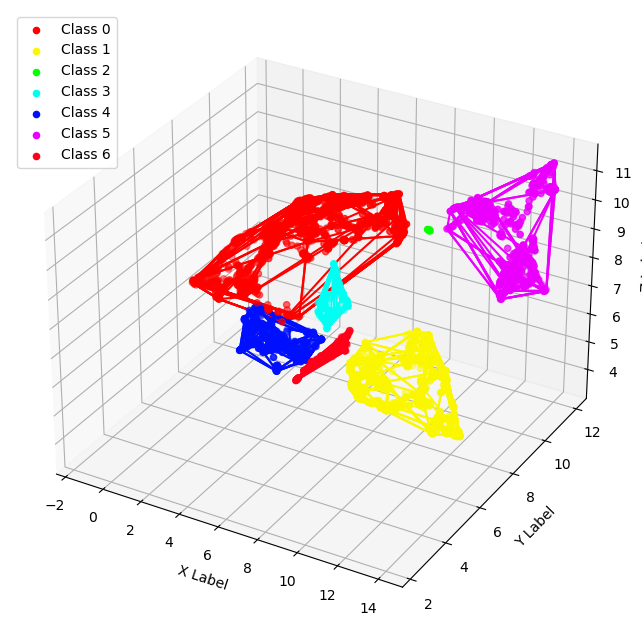

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from scipy.spatial import ConvexHull
import numpy as np

# Load the data
df = pd.read_csv('C:\\Users\\Thomas\\A2OAudioLabeller\\A2OAudioLabeller\\data\\umap-Duval-DryA-20min-full-day.csv')

# Keep only the required columns
df = df[['x', 'y', 'z', 'class']]

# Setup the 3D plot
fig = plt.figure(figsize=(12, 8))
ax = fig.add_subplot(111, projection='3d')

# Get unique classes
classes = df['class'].unique()

# Color map
colors = plt.cm.get_cmap('hsv', len(classes))

for i, cls in enumerate(classes):
    # Filter data for the current class
    cls_data = df[df['class'] == cls]
    
    # Scatter plot
    ax.scatter(cls_data['x'], cls_data['y'], cls_data['z'], label=f'Class {cls}', color=colors(i))
    
    # Optionally plot the convex hull
    if len(cls_data) > 3:  # ConvexHull needs at least 4 points
        try:
            hull = ConvexHull(cls_data[['x', 'y', 'z']])
            for simplex in hull.simplices:
                ax.plot3D(cls_data[['x', 'y', 'z']].iloc[simplex, 0], 
                          cls_data[['x', 'y', 'z']].iloc[simplex, 1], 
                          cls_data[['x', 'y', 'z']].iloc[simplex, 2], color=colors(i))
        except Exception as e:
            print(f"Could not compute convex hull for class {cls}: {e}")

# Adding grid lines, labels, and legend
ax.grid(True)
ax.set_xlabel('X Label')
ax.set_ylabel('Y Label')
ax.set_zlabel('Z Label')
ax.legend()

plt.show()


C:\Users\Thomas\AppData\Local\Temp\ipykernel_61632\3906130517.py:23: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab10', len(classes))


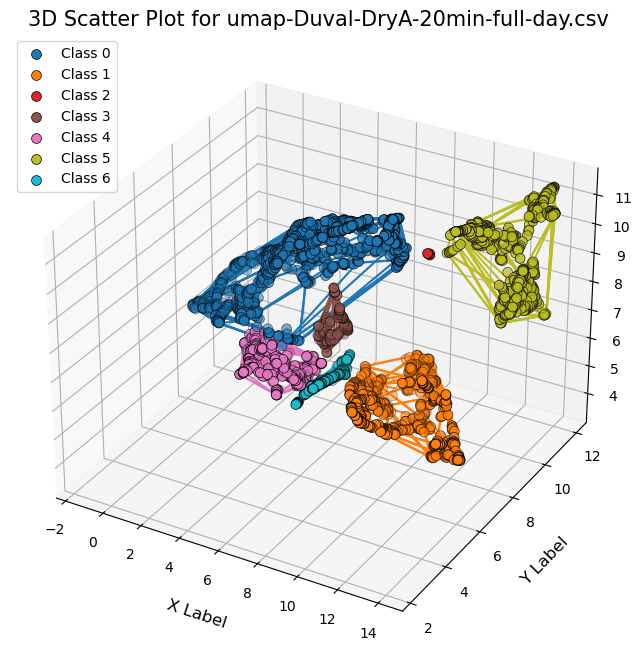

C:\Users\Thomas\AppData\Local\Temp\ipykernel_61632\3906130517.py:23: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab10', len(classes))


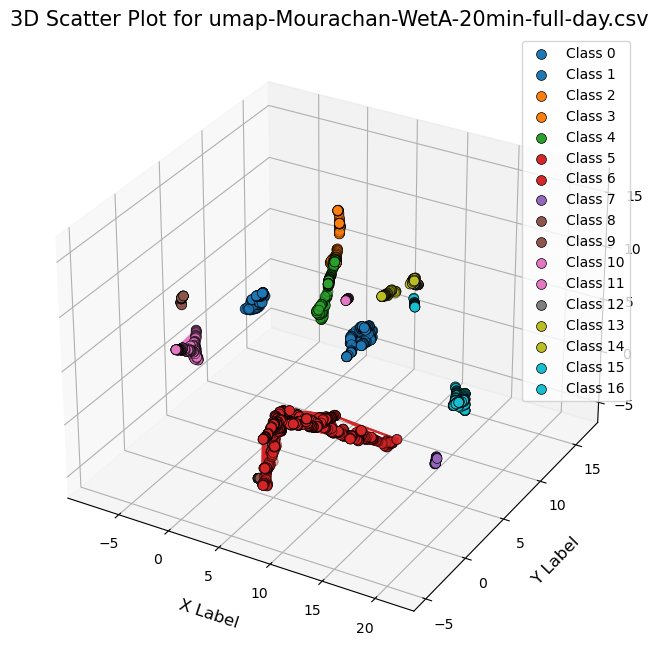

C:\Users\Thomas\AppData\Local\Temp\ipykernel_61632\3906130517.py:23: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab10', len(classes))


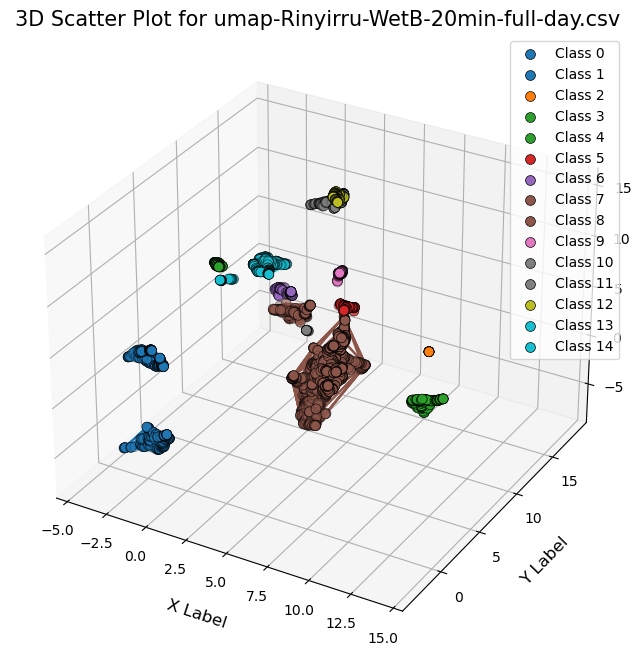

C:\Users\Thomas\AppData\Local\Temp\ipykernel_61632\3906130517.py:23: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab10', len(classes))


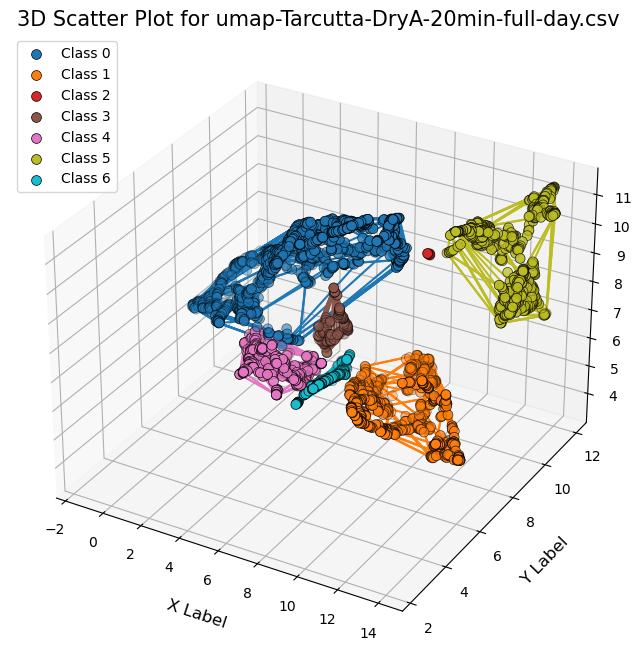

C:\Users\Thomas\AppData\Local\Temp\ipykernel_61632\3906130517.py:23: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab10', len(classes))


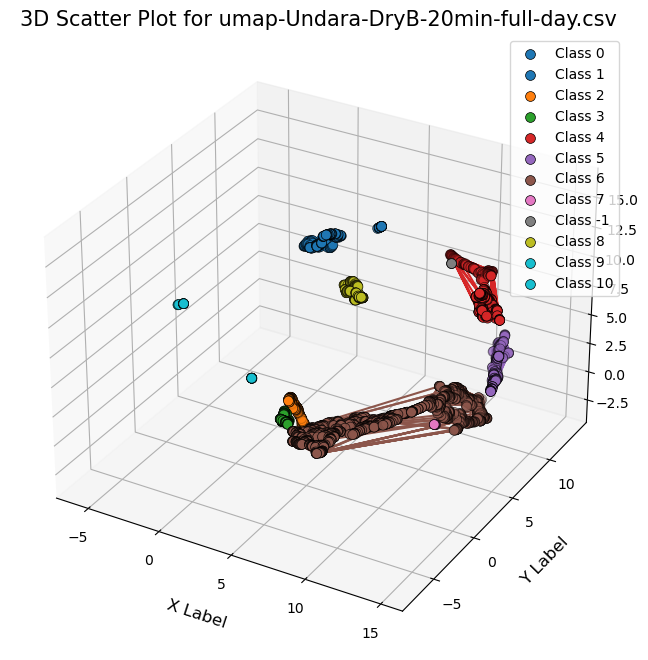

C:\Users\Thomas\AppData\Local\Temp\ipykernel_61632\3906130517.py:23: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab10', len(classes))


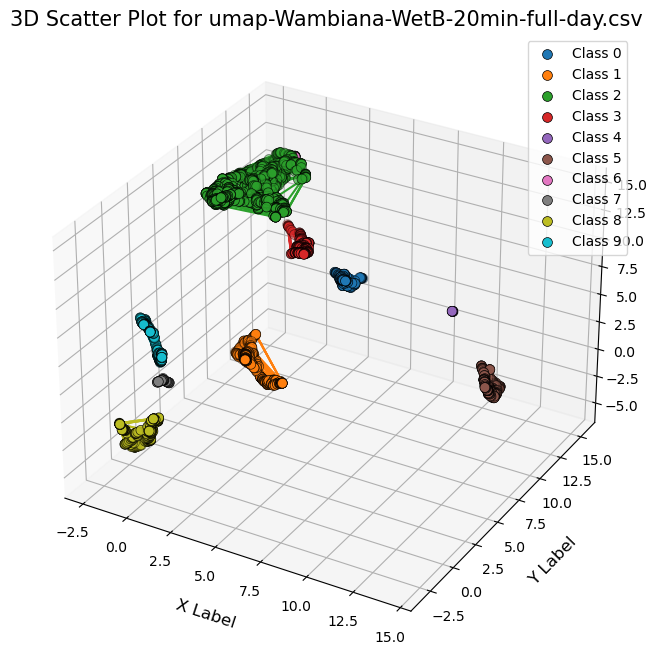

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from scipy.spatial import ConvexHull
import numpy as np
import os

def visualize_csv(file_path):
    # Load the data
    df = pd.read_csv(file_path)

    # Keep only the required columns
    df = df[['x', 'y', 'z', 'class']]

    # Setup the 3D plot
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')

    # Get unique classes
    classes = df['class'].unique()

    # Color map
    colors = plt.cm.get_cmap('tab10', len(classes))

    for i, cls in enumerate(classes):
        # Filter data for the current class
        cls_data = df[df['class'] == cls]
        
        # Scatter plot with outlined markers
        ax.scatter(cls_data['x'], cls_data['y'], cls_data['z'], edgecolors='k', 
                   facecolors=colors(i), s=50, linewidths=0.5, label=f'Class {cls}')
        
        # Optionally plot the convex hull
        if len(cls_data) > 3:  # ConvexHull needs at least 4 points
            try:
                hull = ConvexHull(cls_data[['x', 'y', 'z']])
                for simplex in hull.simplices:
                    ax.plot3D(cls_data[['x', 'y', 'z']].iloc[simplex, 0], 
                              cls_data[['x', 'y', 'z']].iloc[simplex, 1], 
                              cls_data[['x', 'y', 'z']].iloc[simplex, 2], color=colors(i))
            except Exception as e:
                print(f"Could not compute convex hull for class {cls}: {e}")

    # Adding grid lines, labels, and legend with clear visibility
    ax.grid(True)
    ax.set_xlabel('X Label', fontsize=12, labelpad=10)
    ax.set_ylabel('Y Label', fontsize=12, labelpad=10)
    ax.set_zlabel('Z Label', fontsize=12, labelpad=10)
    ax.legend()

    plt.title(f'3D Scatter Plot for {os.path.basename(file_path)}', fontsize=15)
    plt.show()

# Specify the folder containing CSV files
folder_path = 'C:\\Users\\Thomas\\A2OAudioLabeller\\A2OAudioLabeller\\data\\'

# Iterate over all CSV files in the folder
for file_name in os.listdir(folder_path):
    if file_name.endswith('.csv'):
        file_path = os.path.join(folder_path, file_name)
        visualize_csv(file_path)


C:\Users\Thomas\AppData\Local\Temp\ipykernel_6560\2325986876.py:23: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab10', len(classes))


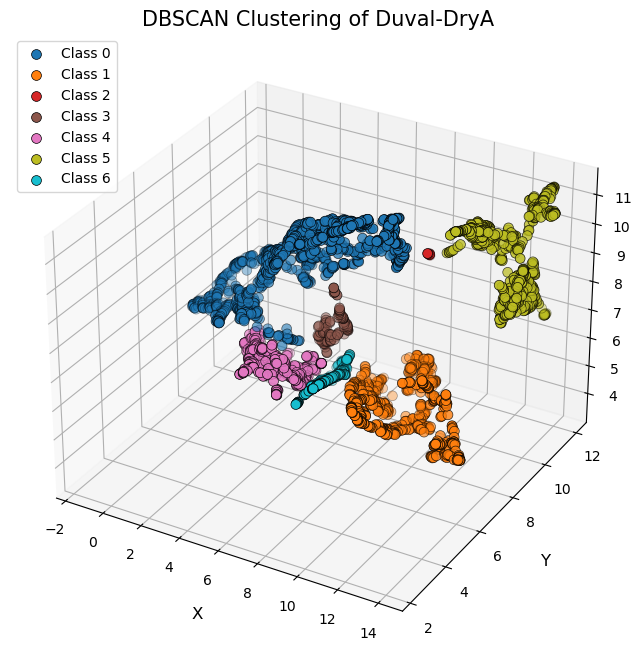

C:\Users\Thomas\AppData\Local\Temp\ipykernel_6560\2325986876.py:23: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab10', len(classes))


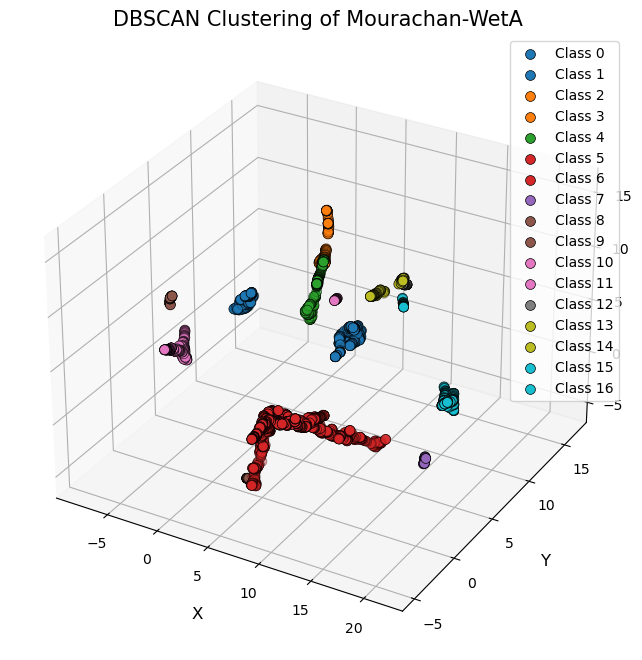

C:\Users\Thomas\AppData\Local\Temp\ipykernel_6560\2325986876.py:23: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab10', len(classes))


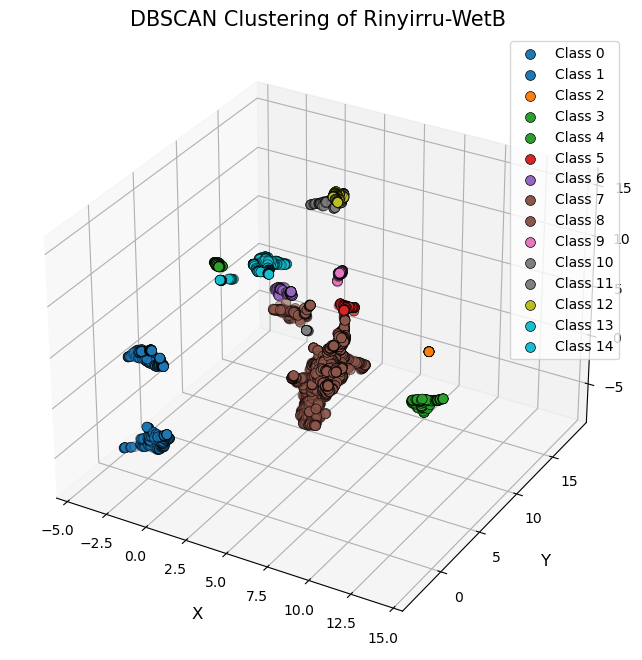

C:\Users\Thomas\AppData\Local\Temp\ipykernel_6560\2325986876.py:23: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab10', len(classes))


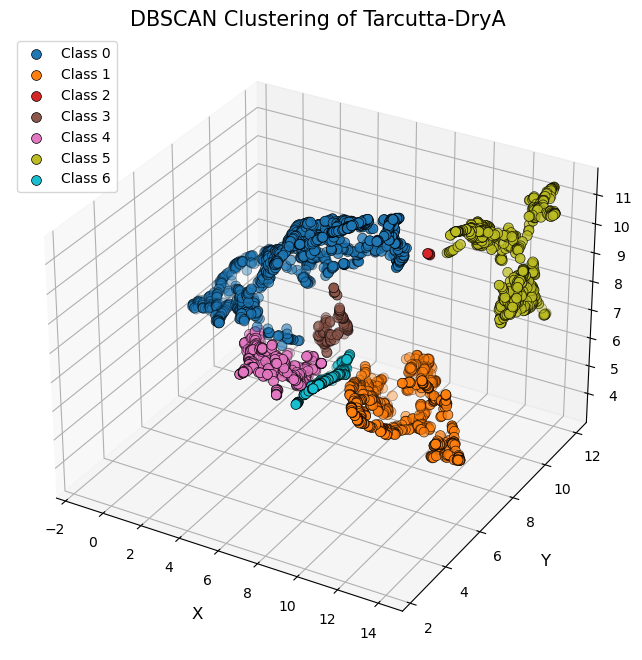

C:\Users\Thomas\AppData\Local\Temp\ipykernel_6560\2325986876.py:23: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab10', len(classes))


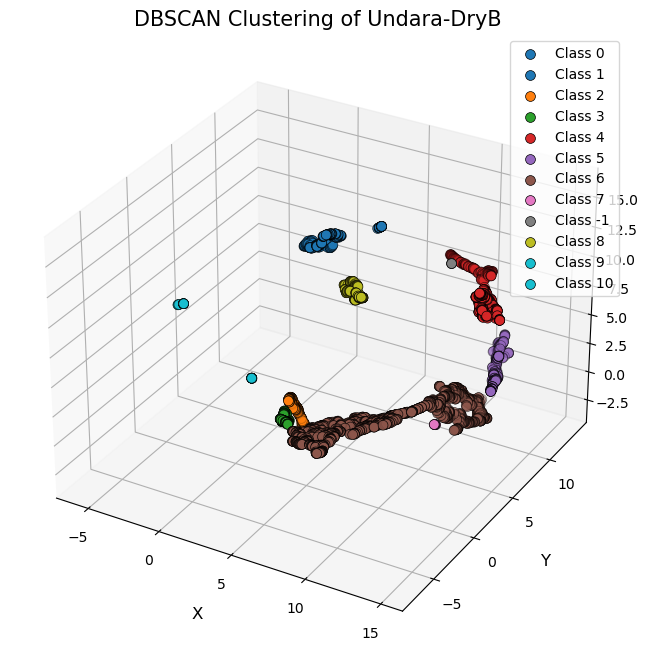

C:\Users\Thomas\AppData\Local\Temp\ipykernel_6560\2325986876.py:23: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab10', len(classes))


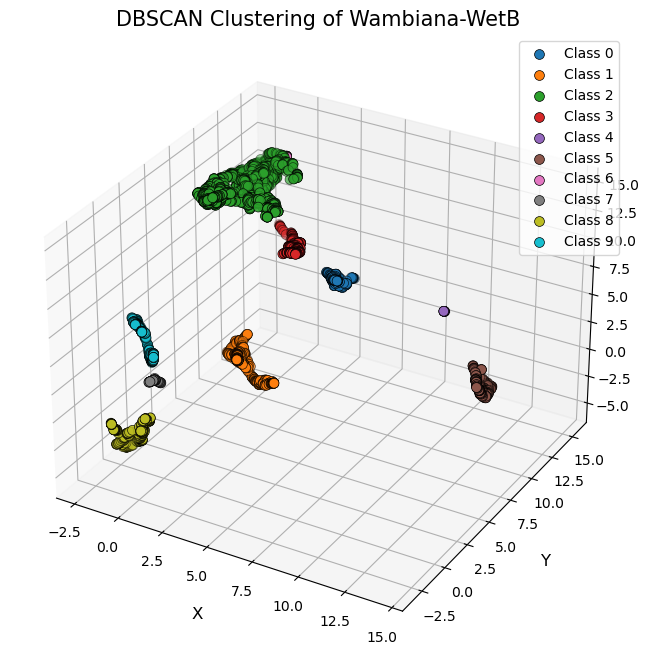

In [82]:
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from scipy.spatial import ConvexHull
import numpy as np
import os

def visualize_csv(file_path):
    # Load the data
    df = pd.read_csv(file_path)

    # Keep only the required columns
    df = df[['x', 'y', 'z', 'class']]

    # Setup the 3D plot
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')

    # Get unique classes
    classes = df['class'].unique()

    # Color map
    colors = plt.cm.get_cmap('tab10', len(classes))

    for i, cls in enumerate(classes):
        # Filter data for the current class
        cls_data = df[df['class'] == cls]
        
        # Scatter plot with outlined markers
        ax.scatter(cls_data['x'], cls_data['y'], cls_data['z'], edgecolors='k', 
                   facecolors=colors(i), s=50, linewidths=0.5, label=f'Class {cls}')
        
        # # Optionally plot the convex hull
        # if len(cls_data) > 3:  # ConvexHull needs at least 4 points
        #     try:
        #         hull = ConvexHull(cls_data[['x', 'y', 'z']])
        #         for simplex in hull.simplices:
        #             ax.plot3D(cls_data[['x', 'y', 'z']].iloc[simplex, 0], 
        #                       cls_data[['x', 'y', 'z']].iloc[simplex, 1], 
        #                       cls_data[['x', 'y', 'z']].iloc[simplex, 2], color=colors(i))
        #     except Exception as e:
        #         print(f"Could not compute convex hull for class {cls}: {e}")

    # Adding grid lines, labels, and legend with clear visibility
    ax.grid(True)
    ax.set_xlabel('X', fontsize=12, labelpad=10)
    ax.set_ylabel('Y', fontsize=12, labelpad=10)
    ax.set_zlabel('Z', fontsize=12, labelpad=15)
    plt.title(f"DBSCAN Clustering of {os.path.basename(file_path).replace('.csv', '')}", fontsize=15)


    
    # Adjust the subplot to prevent cut-off
    # plt.subplots_adjust(left=0.1, right=0.5, top=0.9, bottom=0.1)
    plt.legend()

    # plt.title(f'3D Scatter Plot for {os.path.basename(file_path)}', fontsize=15)
    plt.show()

# Specify the folder containing CSV files
folder_path = 'C:\\Users\\Thomas\\A2OAudioLabeller\\A2OAudioLabeller\\data\\'

# Iterate over all CSV files in the folder
for file_name in os.listdir(folder_path):
    if file_name.endswith('.csv'):
        file_path = os.path.join(folder_path, file_name)
        visualize_csv(file_path)


In [2]:
folder_path = 'C:\\Users\\Thomas\\A2OAudioLabeller\\A2OAudioLabeller\\data\\'

c:\Users\Thomas\conda\envs\audio\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
c:\Users\Thomas\conda\envs\audio\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
c:\Users\Thomas\conda\envs\audio\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
c:\Users\Thomas\conda\envs\audio\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
c:\Users\Thomas\conda\en

File: Duval-DryA.csv
Optimal k: 7, Silhouette: 0.5613, Dunn: 0.0001, Davies-Bouldin: 0.6095, Calinski-Harabasz: 5778.3191



C:\Users\Thomas\AppData\Local\Temp\ipykernel_44756\1098474493.py:66: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab10', optimal_k)


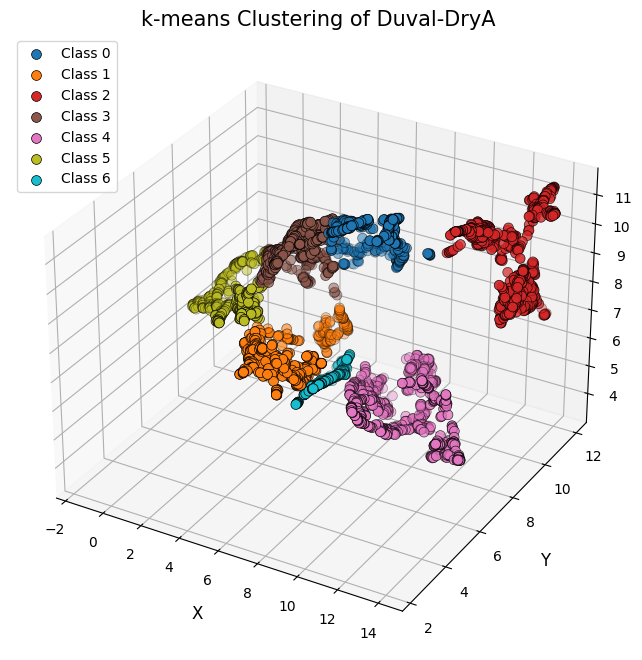

c:\Users\Thomas\conda\envs\audio\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
c:\Users\Thomas\conda\envs\audio\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
c:\Users\Thomas\conda\envs\audio\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
c:\Users\Thomas\conda\envs\audio\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
c:\Users\Thomas\conda\en

File: Mourachan-WetA.csv
Optimal k: 9, Silhouette: 0.7183, Dunn: 0.0000, Davies-Bouldin: 0.3958, Calinski-Harabasz: 6725.9280



C:\Users\Thomas\AppData\Local\Temp\ipykernel_44756\1098474493.py:66: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab10', optimal_k)


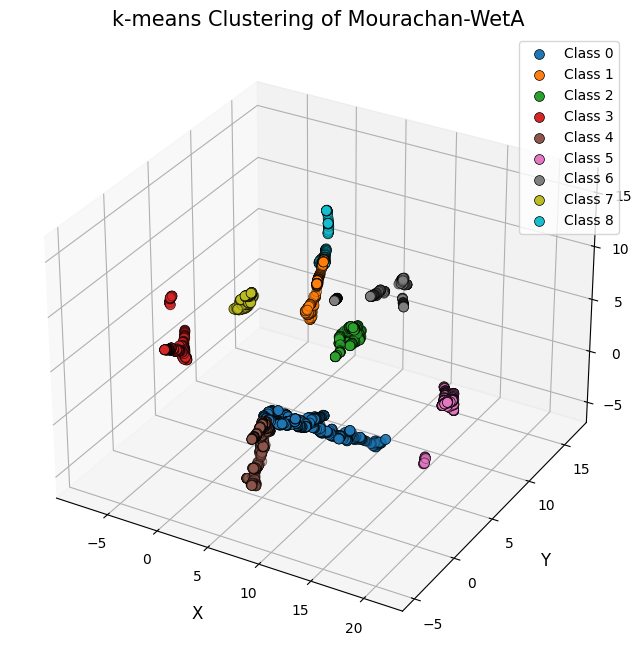

c:\Users\Thomas\conda\envs\audio\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
c:\Users\Thomas\conda\envs\audio\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
c:\Users\Thomas\conda\envs\audio\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
c:\Users\Thomas\conda\envs\audio\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
c:\Users\Thomas\conda\en

File: Rinyirru-WetB.csv
Optimal k: 8, Silhouette: 0.6980, Dunn: 0.0000, Davies-Bouldin: 0.4028, Calinski-Harabasz: 8438.3454



C:\Users\Thomas\AppData\Local\Temp\ipykernel_44756\1098474493.py:66: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab10', optimal_k)


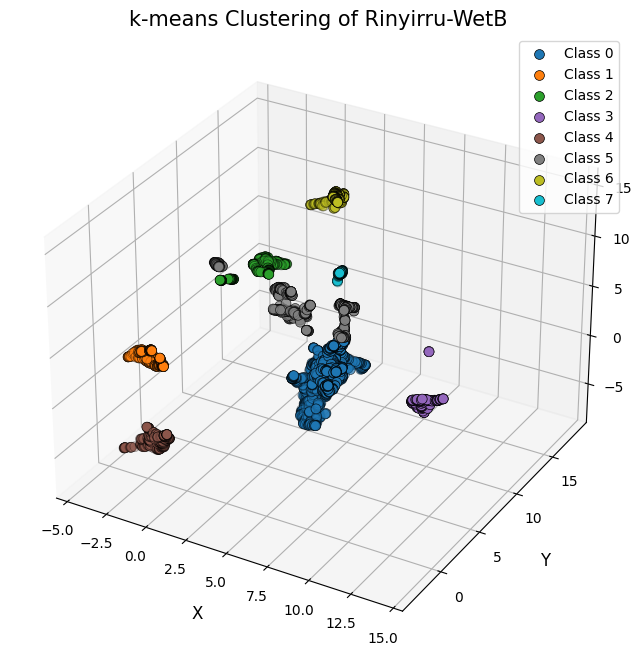

c:\Users\Thomas\conda\envs\audio\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
c:\Users\Thomas\conda\envs\audio\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
c:\Users\Thomas\conda\envs\audio\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
c:\Users\Thomas\conda\envs\audio\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
c:\Users\Thomas\conda\en

File: Tarcutta-DryA.csv
Optimal k: 7, Silhouette: 0.5613, Dunn: 0.0001, Davies-Bouldin: 0.6095, Calinski-Harabasz: 5778.3191



C:\Users\Thomas\AppData\Local\Temp\ipykernel_44756\1098474493.py:66: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab10', optimal_k)


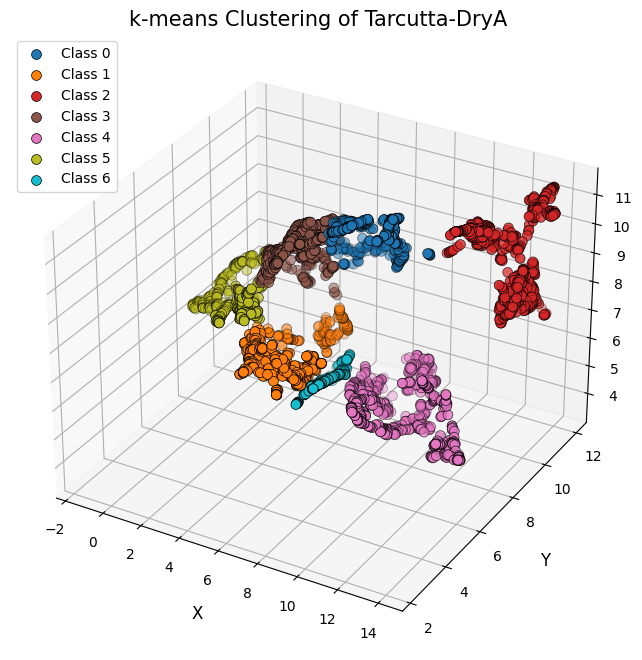

c:\Users\Thomas\conda\envs\audio\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
c:\Users\Thomas\conda\envs\audio\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
c:\Users\Thomas\conda\envs\audio\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
c:\Users\Thomas\conda\envs\audio\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
c:\Users\Thomas\conda\en

File: Undara-DryB.csv
Optimal k: 6, Silhouette: 0.6300, Dunn: 0.0000, Davies-Bouldin: 0.4580, Calinski-Harabasz: 5839.8338



C:\Users\Thomas\AppData\Local\Temp\ipykernel_44756\1098474493.py:66: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab10', optimal_k)


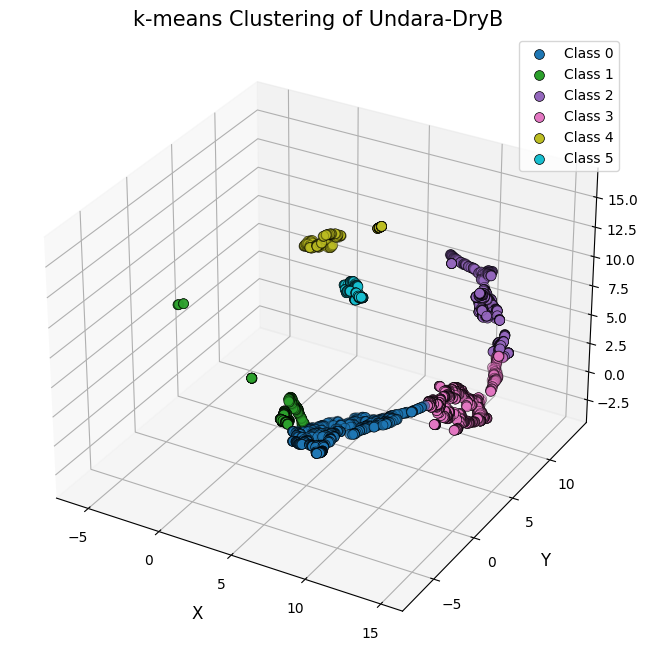

c:\Users\Thomas\conda\envs\audio\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
c:\Users\Thomas\conda\envs\audio\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
c:\Users\Thomas\conda\envs\audio\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
c:\Users\Thomas\conda\envs\audio\lib\site-packages\sklearn\cluster\_kmeans.py:870: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  warnings.warn(
c:\Users\Thomas\conda\en

File: Wambiana-WetB.csv
Optimal k: 6, Silhouette: 0.7774, Dunn: 0.0000, Davies-Bouldin: 0.2667, Calinski-Harabasz: 14222.5528



C:\Users\Thomas\AppData\Local\Temp\ipykernel_44756\1098474493.py:66: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  colors = plt.cm.get_cmap('tab10', optimal_k)


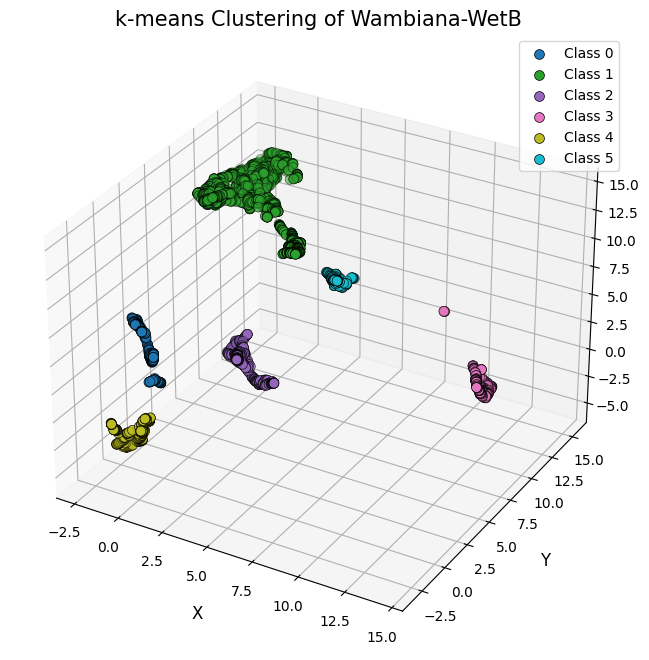

In [4]:
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
from scipy.spatial.distance import pdist, squareform
import numpy as np
import os

def dunn_index(X, labels):
    """
    Compute the Dunn index for a clustering.
    X: array-like, shape (n_samples, n_features)
    labels: array-like, shape (n_samples,)
    """
    distances = squareform(pdist(X))
    np.fill_diagonal(distances, np.inf)
    
    intra_cluster_distances = [np.min(distances[labels == label, :][:, labels == label]) for label in np.unique(labels)]
    min_intra_cluster_distance = np.min(intra_cluster_distances)
    
    inter_cluster_distances = []
    unique_labels = np.unique(labels)
    for i, label_i in enumerate(unique_labels[:-1]):
        for label_j in unique_labels[i+1:]:
            inter_cluster_distances.append(np.min(distances[labels == label_i, :][:, labels == label_j]))
    max_inter_cluster_distance = np.max(inter_cluster_distances)
    
    return min_intra_cluster_distance / max_inter_cluster_distance

def visualize_and_cluster(file_path):
    # Load the data
    df = pd.read_csv(file_path)
    
    # Select the first 3 columns for clustering
    data_for_clustering = df.iloc[:, :3].values
    
    # Find the optimal number of clusters
    silhouette_scores = []
    for k in range(2, 11):  # Trying different values of k
        kmeans = KMeans(n_clusters=k, random_state=42)
        labels = kmeans.fit_predict(data_for_clustering)
        silhouette_scores.append(silhouette_score(data_for_clustering, labels))
    optimal_k = silhouette_scores.index(max(silhouette_scores)) + 2  # Adding 2 because range starts at 2
    
    # Apply K-Means clustering with the optimal number of clusters
    kmeans = KMeans(n_clusters=optimal_k, random_state=42)
    labels = kmeans.fit_predict(data_for_clustering)
    df['cluster'] = labels
    
    # Calculate metrics
    silhouette = silhouette_score(data_for_clustering, labels)
    dunn = dunn_index(data_for_clustering, labels)
    davies_bouldin = davies_bouldin_score(data_for_clustering, labels)
    calinski_harabasz = calinski_harabasz_score(data_for_clustering, labels)
    
    # Print the metrics
    print(f"File: {os.path.basename(file_path)}")
    print(f"Optimal k: {optimal_k}, Silhouette: {silhouette:.4f}, Dunn: {dunn:.4f}, Davies-Bouldin: {davies_bouldin:.4f}, Calinski-Harabasz: {calinski_harabasz:.4f}\n")
    
    # Setup the 3D plot
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')
    
    # Color map
    colors = plt.cm.get_cmap('tab10', optimal_k)
    
    # Plot each cluster
    for i in range(optimal_k):
        cluster_data = df[df['cluster'] == i]
        ax.scatter(cluster_data.iloc[:, 0], cluster_data.iloc[:, 1], cluster_data.iloc[:, 2], 
                   color=colors(i), edgecolor='k', s=50, linewidths=0.5, label=f'Class {i}')
    
    # Adding grid lines, labels, and legend with clear visibility
    ax.grid(True)
    ax.set_xlabel('X', fontsize=12, labelpad=10)
    ax.set_ylabel('Y', fontsize=12, labelpad=10)
    ax.set_zlabel('Z', fontsize=12, labelpad=15)
    plt.legend()
    plt.title(f"k-means Clustering of {os.path.basename(file_path).replace('.csv', '')}", fontsize=15)
    plt.show()

# Path to the directory containing UMAP files
folder_path = 'C:\\Users\\Thomas\\A2OAudioLabeller\\A2OAudioLabeller\\src\\data'

# Iterate over all UMAP files in the directory
for file_name in os.listdir(folder_path):
    if file_name.endswith('.csv'):
        file_path = os.path.join(folder_path, file_name)
        visualize_and_cluster(file_path)


In [10]:
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
from scipy.spatial.distance import pdist, squareform
import numpy as np
import os

def dunn_index(X, labels):
    distances = squareform(pdist(X))
    np.fill_diagonal(distances, np.inf)
    
    intra_cluster_distances = [np.min(distances[labels == label, :][:, labels == label]) for label in np.unique(labels)]
    min_intra_cluster_distance = np.min(intra_cluster_distances)
    
    inter_cluster_distances = []
    unique_labels = np.unique(labels)
    for i, label_i in enumerate(unique_labels[:-1]):
        for label_j in unique_labels[i+1:]:
            inter_cluster_distances.append(np.min(distances[labels == label_i, :][:, labels == label_j]))
    max_inter_cluster_distance = np.max(inter_cluster_distances)
    
    return min_intra_cluster_distance / max_inter_cluster_distance

def normalize_and_calculate_composite_score(silhouette, calinski, davies, dunn, metrics_ranges):
    normalized_silhouette = (silhouette - metrics_ranges['silhouette']['min']) / (metrics_ranges['silhouette']['max'] - metrics_ranges['silhouette']['min'])
    normalized_calinski = (calinski - metrics_ranges['calinski']['min']) / (metrics_ranges['calinski']['max'] - metrics_ranges['calinski']['min'])
    normalized_davies = 1 - ((davies - metrics_ranges['davies']['min']) / (metrics_ranges['davies']['max'] - metrics_ranges['davies']['min']))
    normalized_dunn = (dunn - metrics_ranges['dunn']['min']) / (metrics_ranges['dunn']['max'] - metrics_ranges['dunn']['min'])

    composite_score = normalized_silhouette + normalized_calinski + normalized_davies + normalized_dunn
    return composite_score

def visualize_and_cluster(file_path):
    df = pd.read_csv(file_path)
    data_for_clustering = df.iloc[:, :3].values

    # Initialize metric ranges for normalization
    metrics_ranges = {
        'silhouette': {'min': float('inf'), 'max': float('-inf')},
        'calinski': {'min': float('inf'), 'max': float('-inf')},
        'davies': {'min': float('inf'), 'max': float('-inf')},
        'dunn': {'min': float('inf'), 'max': float('-inf')}
    }

    # Find the optimal number of clusters based on silhouette score
    silhouette_scores = []
    all_metrics = []
    for k in range(2, 11):
        kmeans = KMeans(n_clusters=k, random_state=42)
        labels = kmeans.fit_predict(data_for_clustering)
        silhouette = silhouette_score(data_for_clustering, labels)
        silhouette_scores.append(silhouette)
        
        # Calculate other metrics for normalization later
        dunn = dunn_index(data_for_clustering, labels)
        davies_bouldin = davies_bouldin_score(data_for_clustering, labels)
        calinski_harabasz = calinski_harabasz_score(data_for_clustering, labels)
        all_metrics.append((silhouette, calinski_harabasz, davies_bouldin, dunn))

        # Update metric ranges
        metrics_ranges['silhouette']['min'] = min(metrics_ranges['silhouette']['min'], silhouette)
        metrics_ranges['silhouette']['max'] = max(metrics_ranges['silhouette']['max'], silhouette)
        metrics_ranges['calinski']['min'] = min(metrics_ranges['calinski']['min'], calinski_harabasz)
        metrics_ranges['calinski']['max'] = max(metrics_ranges['calinski']['max'], calinski_harabasz)
        metrics_ranges['davies']['min'] = min(metrics_ranges['davies']['min'], davies_bouldin)
        metrics_ranges['davies']['max'] = max(metrics_ranges['davies']['max'], davies_bouldin)
        metrics_ranges['dunn']['min'] = min(metrics_ranges['dunn']['min'], dunn)
        metrics_ranges['dunn']['max'] = max(metrics_ranges['dunn']['max'], dunn)

    optimal_k = silhouette_scores.index(max(silhouette_scores)) + 2

    # Apply K-Means with the optimal number of clusters and calculate the composite score
    kmeans = KMeans(n_clusters=optimal_k, random_state=42)
    labels = kmeans.fit_predict(data_for_clustering)
    silhouette, calinski_harabasz, davies_bouldin, dunn = all_metrics[optimal_k - 2]  # -2 because range starts at 2
    composite_score = normalize_and_calculate_composite_score(silhouette, calinski_harabasz, davies_bouldin, dunn, metrics_ranges)

    # Print metrics and composite score
    print(f"File: {os.path.basename(file_path)}")
    print(f"Optimal k: {optimal_k}, Composite Score: {composite_score:.4f}\n")
    print(f"Silhouette: {silhouette:.4f}, Dunn: {dunn:.4f}, Davies-Bouldin: {davies_bouldin:.4f}, Calinski-Harabasz: {calinski_harabasz:.4f}\n")

    # Visualization code remains the same

folder_path = 'C:\\Users\\Thomas\\A2OAudioLabeller\\A2OAudioLabeller\\data\\'
for file_name in os.listdir(folder_path):
    if file_name.endswith('.csv'):
        file_path = os.path.join(folder_path, file_name)
        visualize_and_cluster(file_path)


c:\Users\Thomas\conda\envs\audiohandling\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\Thomas\conda\envs\audiohandling\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\Thomas\conda\envs\audiohandling\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\Thomas\conda\envs\audiohandling\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of

File: Duval-DryA.csv
Optimal k: 7, Composite Score: 2.7898

Silhouette: 0.5613, Dunn: 0.0001, Davies-Bouldin: 0.6094, Calinski-Harabasz: 5778.3299



c:\Users\Thomas\conda\envs\audiohandling\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\Thomas\conda\envs\audiohandling\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\Thomas\conda\envs\audiohandling\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\Thomas\conda\envs\audiohandling\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of

File: Mourachan-WetA.csv
Optimal k: 9, Composite Score: 2.6313

Silhouette: 0.7183, Dunn: 0.0000, Davies-Bouldin: 0.3958, Calinski-Harabasz: 6725.9280



c:\Users\Thomas\conda\envs\audiohandling\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\Thomas\conda\envs\audiohandling\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\Thomas\conda\envs\audiohandling\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\Thomas\conda\envs\audiohandling\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of

File: Rinyirru-WetB.csv
Optimal k: 8, Composite Score: 2.5250

Silhouette: 0.6982, Dunn: 0.0000, Davies-Bouldin: 0.4024, Calinski-Harabasz: 8438.3172



c:\Users\Thomas\conda\envs\audiohandling\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\Thomas\conda\envs\audiohandling\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\Thomas\conda\envs\audiohandling\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\Thomas\conda\envs\audiohandling\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of

File: Tarcutta-DryA.csv
Optimal k: 7, Composite Score: 2.7898

Silhouette: 0.5613, Dunn: 0.0001, Davies-Bouldin: 0.6094, Calinski-Harabasz: 5778.3299



c:\Users\Thomas\conda\envs\audiohandling\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\Thomas\conda\envs\audiohandling\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\Thomas\conda\envs\audiohandling\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\Thomas\conda\envs\audiohandling\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of

File: Undara-DryB.csv
Optimal k: 6, Composite Score: 2.5829

Silhouette: 0.6300, Dunn: 0.0000, Davies-Bouldin: 0.4580, Calinski-Harabasz: 5839.8338



c:\Users\Thomas\conda\envs\audiohandling\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\Thomas\conda\envs\audiohandling\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\Thomas\conda\envs\audiohandling\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\Thomas\conda\envs\audiohandling\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of

File: Wambiana-WetB.csv
Optimal k: 6, Composite Score: 2.5805

Silhouette: 0.7774, Dunn: 0.0000, Davies-Bouldin: 0.2667, Calinski-Harabasz: 14222.5528



c:\Users\Thomas\conda\envs\audiohandling\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


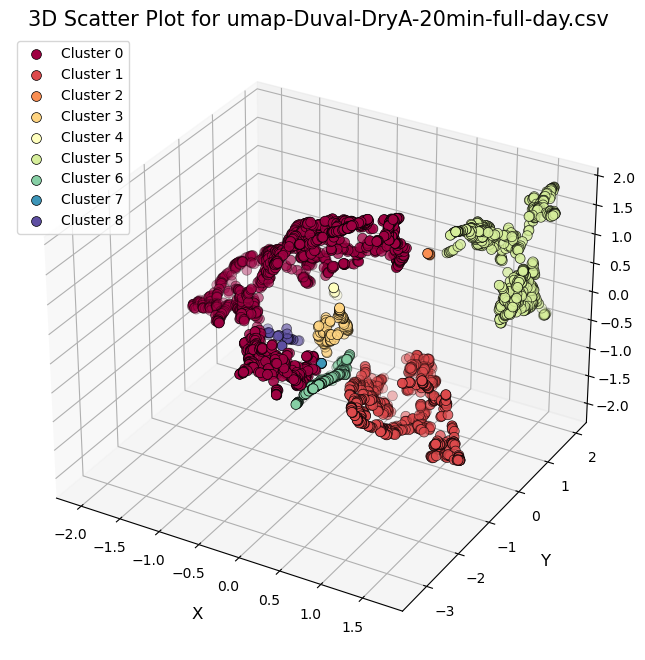

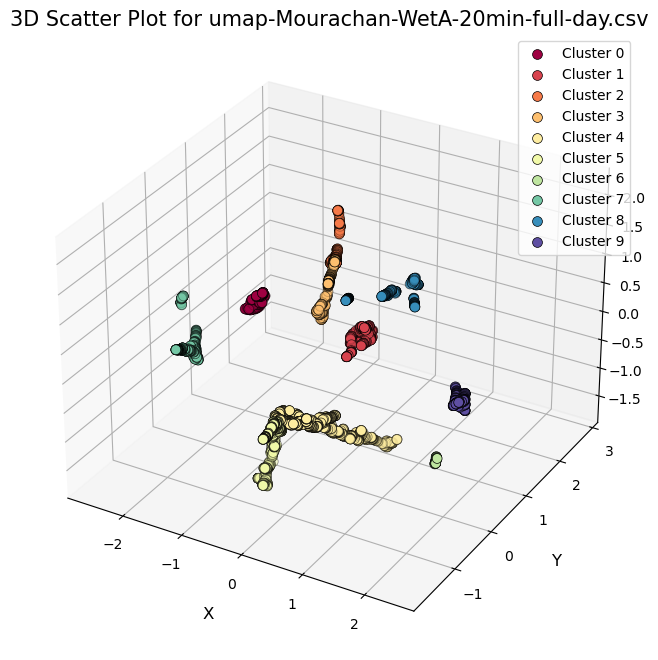

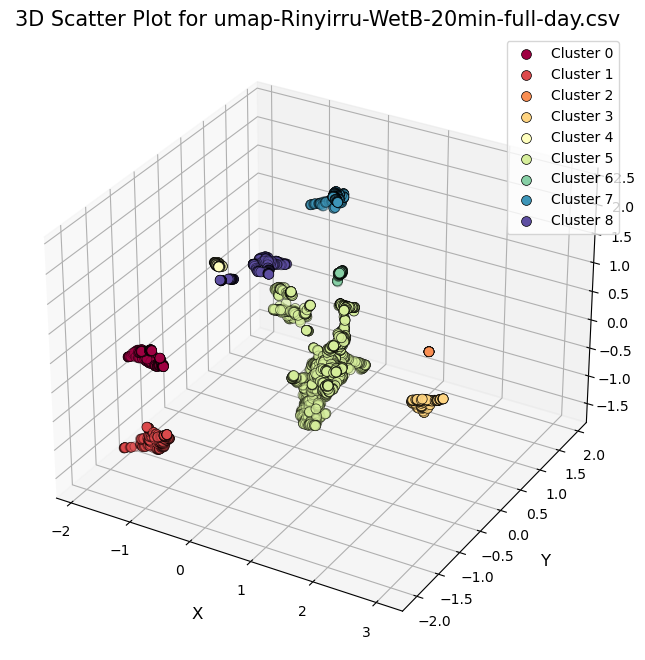

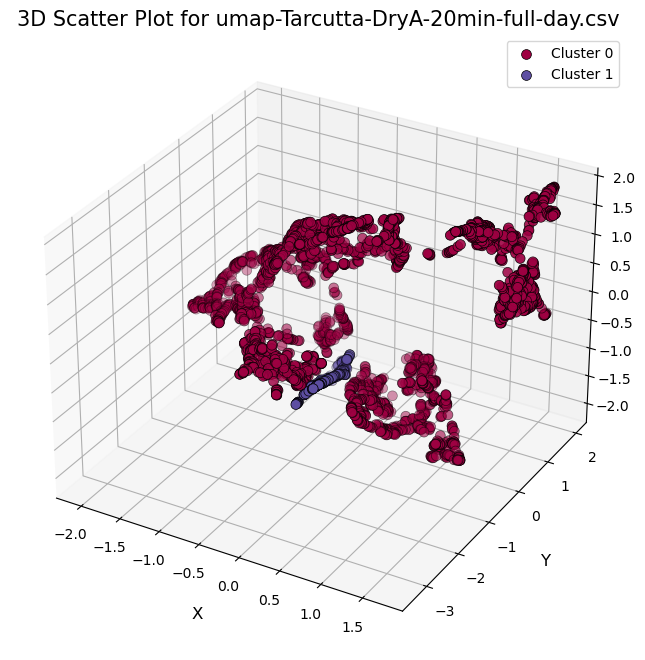

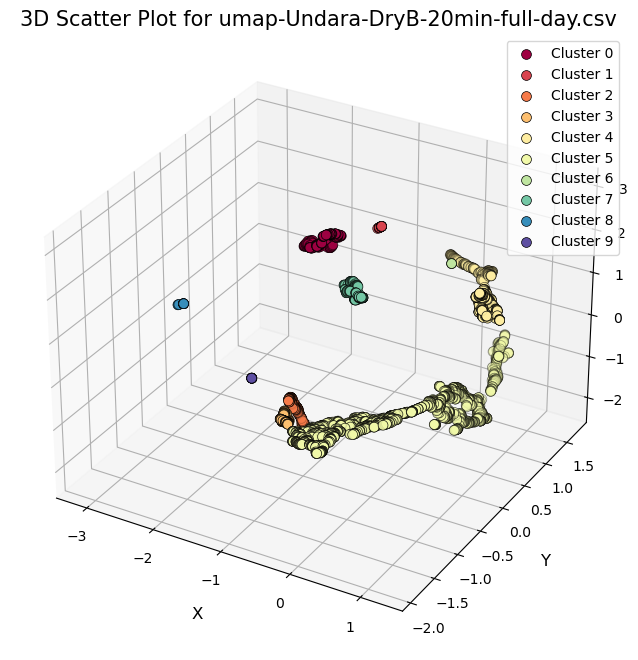

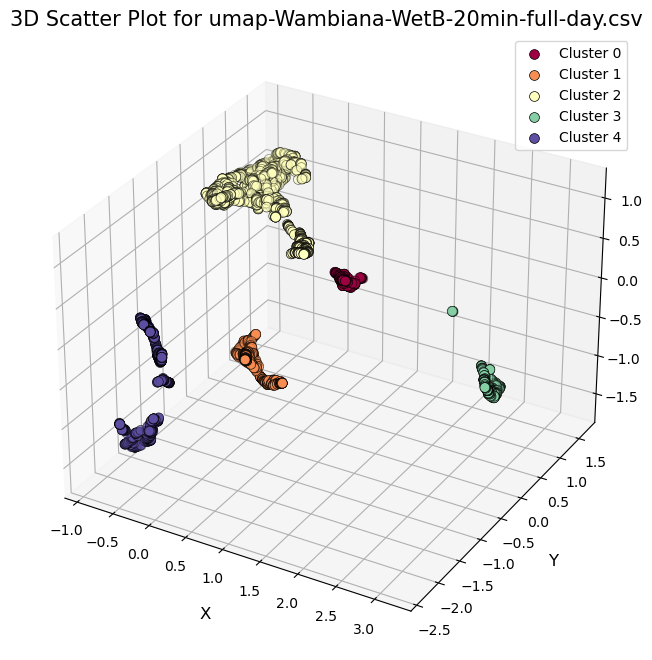

In [73]:
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
import os

# Optimized parameters for each dataset
optimized_params = {
    'umap-Duval-DryA-20min-full-day.csv': {'eps': 0.2, 'min_samples': 3},
    'umap-Mourachan-WetA-20min-full-day.csv': {'eps': 0.6, 'min_samples': 2},
    'umap-Rinyirru-WetB-20min-full-day.csv': {'eps': 0.4, 'min_samples': 2},
    'umap-Tarcutta-DryA-20min-full-day.csv': {'eps': 0.6, 'min_samples': 6},
    'umap-Undara-DryB-20min-full-day.csv': {'eps': 0.2, 'min_samples': 2},
    'umap-Wambiana-WetB-20min-full-day.csv': {'eps': 0.7, 'min_samples': 2}
}

def visualize_clustered_data(file_path, eps, min_samples):
    # Load the data
    df = pd.read_csv(file_path)

    # Keeping only the required columns
    df = df[['x', 'y', 'z']]

    # Data scaling
    scaler = StandardScaler()
    scaled_data = scaler.fit_transform(df)

    # Clustering
    db = DBSCAN(eps=eps, min_samples=min_samples).fit(scaled_data)
    labels = db.labels_

    # Setup the 3D plot
    fig = plt.figure(figsize=(10, 8))
    ax = fig.add_subplot(111, projection='3d')

    # Plotting each cluster
    unique_labels = set(labels)
    colors = [plt.cm.Spectral(each) for each in np.linspace(0, 1, len(unique_labels))]
    for k, col in zip(unique_labels, colors):
        if k == -1:
            # Black used for noise.
            col = [0, 0, 0, 1]

        class_member_mask = (labels == k)

        xyz = scaled_data[class_member_mask]
        ax.scatter(xyz[:, 0], xyz[:, 1], xyz[:, 2], c=[col], edgecolors='k', s=50, linewidths=0.5, label=f'Cluster {k}')

    # Adding grid lines, labels, and legend with clear visibility
    ax.grid(True)
    ax.set_xlabel('X', fontsize=12, labelpad=10)
    ax.set_ylabel('Y', fontsize=12, labelpad=10)
    ax.set_zlabel('Z', fontsize=12, labelpad=15)

    plt.title(f'3D Scatter Plot for {os.path.basename(file_path)}', fontsize=15)
    plt.legend()
    plt.show()

# Specify the folder containing the datasets
folder_path = 'C:\\Users\\Thomas\\A2OAudioLabeller\\A2OAudioLabeller\\data\\'

# Iterate over each dataset and visualize
for file_name, params in optimized_params.items():
    file_path = os.path.join(folder_path, file_name)
    if os.path.exists(file_path):
        visualize_clustered_data(file_path, **params)
    else:
        print(f"File {file_name} not found in {folder_path}")


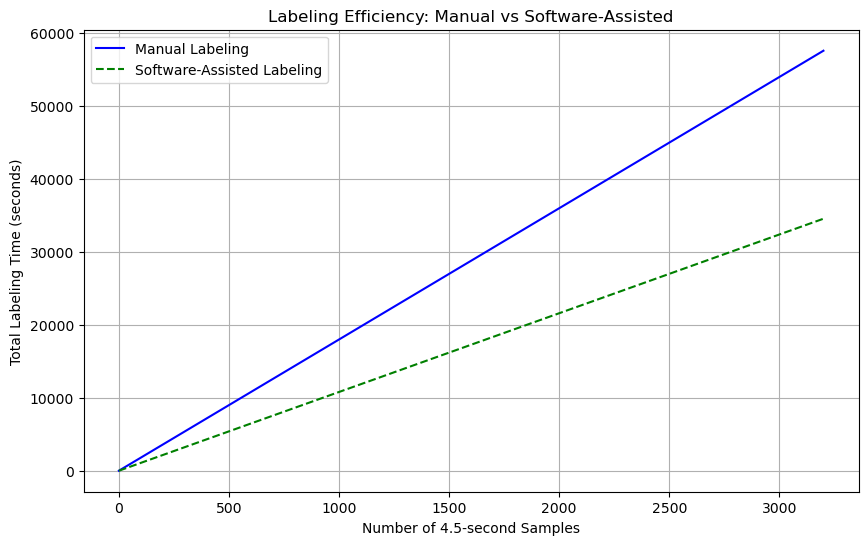

In [22]:
import matplotlib.pyplot as plt
import numpy as np

# Settings
samples = np.arange(0, 3205, 50)  # Number of 4.5-second samples
manual_time_per_30s_sample = 120  # 120 seconds for each 30-second sample
time_per_45s_sample_manual = manual_time_per_30s_sample / (30 / 4.5)  # Time to label each 4.5-second sample manually
proportion_to_label = 0.1  # 10% of each cluster needs manual labeling
x = 10  # Assuming x seconds for software-assisted labeling per 4.5-second sample for illustration

# Calculations
manual_labeling_time = time_per_45s_sample_manual * samples
software_labeling_time = (time_per_45s_sample_manual * proportion_to_label * samples) + (x * (1 - proportion_to_label) * samples)

# Plotting
plt.figure(figsize=(10, 6))
plt.plot(samples, manual_labeling_time, label='Manual Labeling', color='blue')
plt.plot(samples, software_labeling_time, label='Software-Assisted Labeling', color='green', linestyle='--')
plt.xlabel('Number of 4.5-second Samples')
plt.ylabel('Total Labeling Time (seconds)')
plt.title('Labeling Efficiency: Manual vs Software-Assisted')
plt.legend()
plt.grid(True)
plt.show()


In [23]:




import pandas as pd
import os

# Specify your folder path containing the CSV files
folder_path = 'C:\\Users\\Thomas\\A2OAudioLabeller\\A2OAudioLabeller\\data'

# List all CSV files in the folder
csv_files = [f for f in os.listdir(folder_path) if f.endswith('.csv')]

# Dictionary to hold the counts for each file
class_counts_per_file = {}

# Process each file
for file in csv_files:
    file_path = os.path.join(folder_path, file)
    
    # Read the CSV file
    df = pd.read_csv(file_path, usecols=['class'])  # Assuming 'class' is the column name for class labels
    
    # Count the occurrences of each class label
    class_counts = df['class'].value_counts().to_dict()
    
    # Store the counts for this file
    class_counts_per_file[file] = class_counts

# Print the counts for each class in each file
for file, counts in class_counts_per_file.items():
    print(f"File: {file}")
    for class_label, count in counts.items():
        print(f"Class {class_label}: {count} points")
    print()  # Blank line for readability between files


File: umap-Duval-DryA-20min-full-day.csv
Class 0: 1245 points
Class 1: 658 points
Class 5: 636 points
Class 4: 356 points
Class 6: 200 points
Class 3: 102 points
Class 2: 7 points

File: umap-Mourachan-WetA-20min-full-day.csv
Class 5: 837 points
Class 6: 483 points
Class 4: 269 points
Class 1: 264 points
Class 0: 261 points
Class 10: 212 points
Class 16: 204 points
Class 3: 144 points
Class 2: 120 points
Class 13: 78 points
Class 14: 68 points
Class 7: 64 points
Class 9: 55 points
Class 12: 51 points
Class 15: 35 points
Class 11: 34 points
Class 8: 25 points

File: umap-Rinyirru-WetB-20min-full-day.csv
Class 8: 1278 points
Class 1: 267 points
Class 0: 266 points
Class 3: 257 points
Class 13: 228 points
Class 7: 185 points
Class 11: 137 points
Class 12: 131 points
Class 4: 121 points
Class 9: 101 points
Class 6: 91 points
Class 5: 90 points
Class 14: 29 points
Class 10: 12 points
Class 2: 11 points

File: umap-Tarcutta-DryA-20min-full-day.csv
Class 0: 1245 points
Class 1: 658 points
Cla

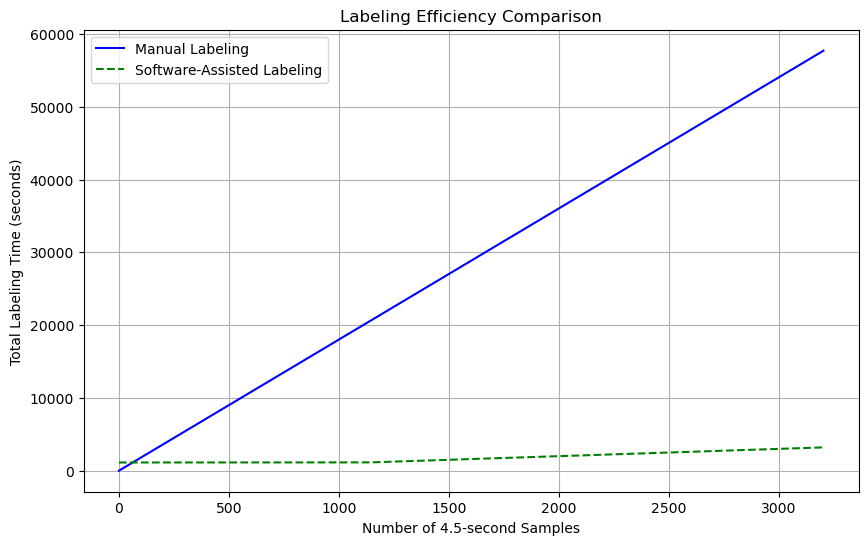

In [24]:
import matplotlib.pyplot as plt
import numpy as np

# Constants
total_samples = 3205
manual_time_per_sample = 120 / (30 / 4.5)  # Convert to 4.5-second samples
software_time_per_sample = 10
proportion_to_label = 0.1  # 10% of the cluster

# Manual labeling time for all samples
manual_labeling_time = np.linspace(0, total_samples * manual_time_per_sample, total_samples)

# Software-assisted labeling simulation
np.random.seed(42)  # For reproducibility
cluster_sizes = np.random.randint(5, 1427, size=1000)  # Generate random cluster sizes
cluster_labels_time = cluster_sizes * proportion_to_label * software_time_per_sample  # Time to label 10% of each cluster
cumulative_cluster_sizes = np.cumsum(cluster_sizes)
software_labeling_time = np.interp(np.arange(total_samples), cumulative_cluster_sizes, np.cumsum(cluster_labels_time))

# Plot
plt.figure(figsize=(10, 6))
plt.plot(range(total_samples), manual_labeling_time, label='Manual Labeling', color='blue')
plt.plot(range(total_samples), software_labeling_time, label='Software-Assisted Labeling', color='green', linestyle='--')
plt.xlabel('Number of 4.5-second Samples')
plt.ylabel('Total Labeling Time (seconds)')
plt.title('Labeling Efficiency Comparison')
plt.legend()
plt.grid(True)
plt.show()


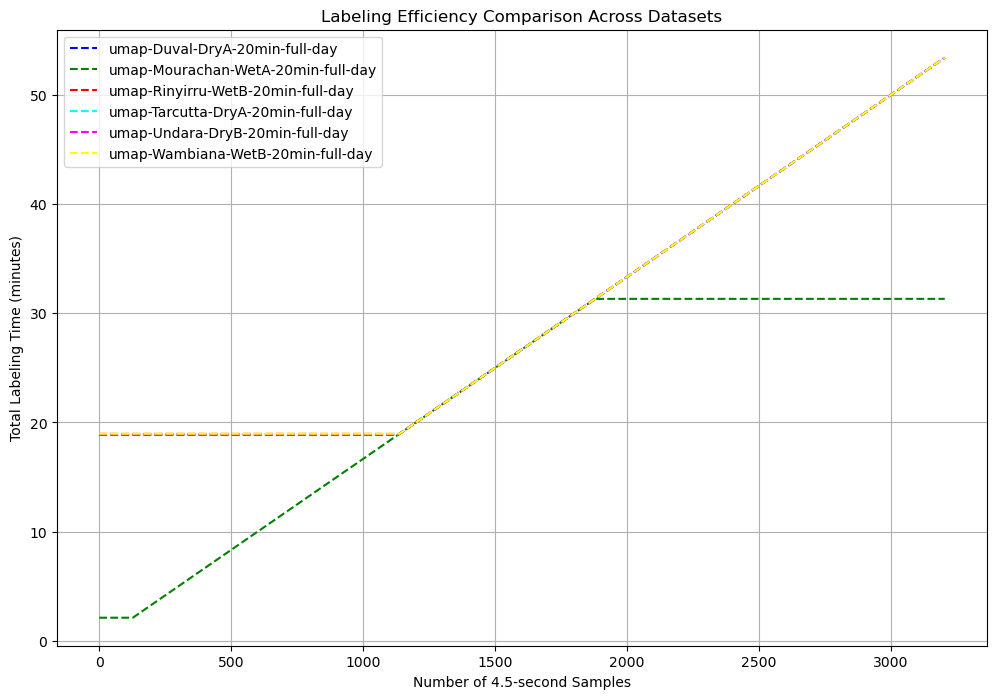

In [12]:
import matplotlib.pyplot as plt
import numpy as np

# Constants
total_samples = 3205
manual_time_per_sample = 120 / (30 / 4.5) / 60  # Convert to minutes for 4.5-second samples
software_time_per_sample = 10 / 60  # Convert to minutes
proportion_to_label = 0.1  # 10% of the cluster

# Cluster size ranges for each dataset
cluster_ranges = {
    'umap-Duval-DryA-20min-full-day.csv': (7, 1245),
    'umap-Mourachan-WetA-20min-full-day.csv': (25, 837),
    'umap-Rinyirru-WetB-20min-full-day.csv': (11, 1278),
    'umap-Tarcutta-DryA-20min-full-day.csv': (7, 1245),
    'umap-Undara-DryB-20min-full-day.csv': (5, 1350),
    'umap-Wambiana-WetB-20min-full-day.csv': (12, 1426)
}

# Plot setup
plt.figure(figsize=(12, 8))
colors = ['blue', 'green', 'red', 'cyan', 'magenta', 'yellow']
i = 0  # Index for color selection

for dataset, (min_size, max_size) in cluster_ranges.items():
    # Generate random cluster sizes within the specified range for each dataset
    np.random.seed(42)  # Ensure reproducibility
    cluster_sizes = np.random.randint(min_size, max_size + 1, size=int(total_samples / ((min_size + max_size) / 2)))
    
    # Calculate the time to label 10% of each cluster
    cluster_labels_time = cluster_sizes * proportion_to_label * software_time_per_sample
    cumulative_cluster_sizes = np.cumsum(cluster_sizes)
    software_labeling_time = np.interp(np.arange(total_samples), cumulative_cluster_sizes, np.cumsum(cluster_labels_time))

    # Plot software-assisted labeling time for each dataset
    plt.plot(range(total_samples), software_labeling_time, label=dataset.split('.')[0], color=colors[i], linestyle='--')
    i += 1  # Move to the next color for the next dataset

# # Plot manual labeling time for comparison
# manual_labeling_time = np.linspace(0, total_samples * manual_time_per_sample, total_samples)
# plt.plot(range(total_samples), manual_labeling_time, label='Manual Labeling', color='black', linewidth=2)

# Finalize plot
plt.xlabel('Number of 4.5-second Samples')
plt.ylabel('Total Labeling Time (minutes)')
plt.title('Labeling Efficiency Comparison Across Datasets')
plt.legend(loc='upper left')
plt.grid(True)
plt.show()


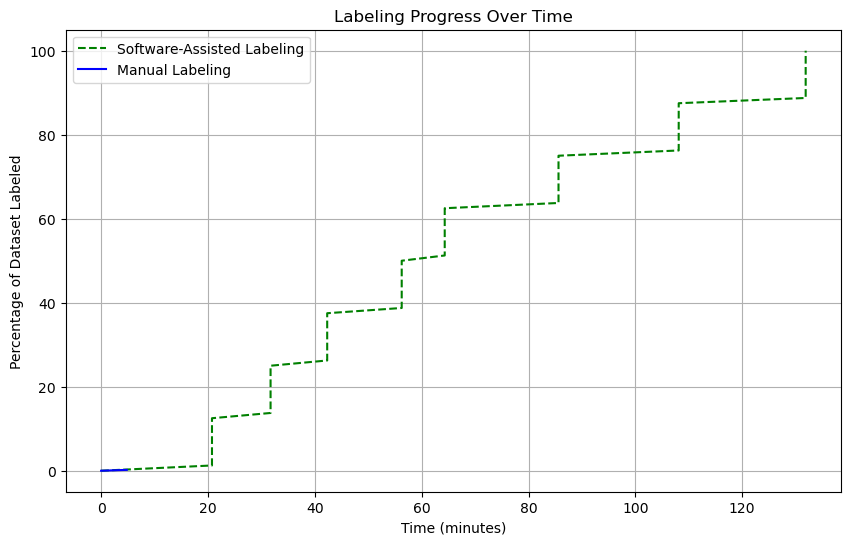

In [11]:
import matplotlib.pyplot as plt
import numpy as np

# Constants
manual_label_time_per_sample = 120 / (30 / 4.5)  # Time per 4.5-second sample in seconds
software_label_time_per_sample = 10  # Time per 4.5-second sample in seconds
proportion_to_label = 0.1  # Proportion of each cluster to manually label

# Cluster sizes for each dataset (assuming a representative sample of cluster sizes)
cluster_sizes = [1245, 658, 636, 837, 483, 1278, 1350, 1426]

# Calculate time to manually label 10% of each cluster
time_to_label_10_percent = [size * proportion_to_label * software_label_time_per_sample for size in cluster_sizes]

# Initialize arrays to hold cumulative percentages and time
cumulative_percentage_labeled = []
cumulative_time = []

# Initially, 0% is labeled at time 0
cumulative_percentage_labeled.append(0)
cumulative_time.append(0)

# Loop through each cluster, simulating the labeling process
for time in time_to_label_10_percent:
    # Update the time and percentage labeled after manually labeling 10% of the current cluster
    cumulative_time.append(cumulative_time[-1] + time)
    cumulative_percentage_labeled.append(cumulative_percentage_labeled[-1] + proportion_to_label * 100 / len(cluster_sizes))
    
    # Update the time instantly (no additional time) to reflect applying the label to the remaining 90% of the cluster
    cumulative_time.append(cumulative_time[-1])
    cumulative_percentage_labeled.append(cumulative_percentage_labeled[-1] + (1 - proportion_to_label) * 100 / len(cluster_sizes))

# Convert time to minutes
cumulative_time = [t / 60 for t in cumulative_time]

# Manual labeling line for comparison (linear growth)
total_samples = sum(cluster_sizes)
total_manual_time_minutes = np.linspace(0, total_samples * manual_label_time_per_sample / 60, total_samples)
percentage_labeled_manual = np.linspace(0, 100, total_samples)

# Plot
plt.figure(figsize=(10, 6))
plt.plot(cumulative_time, cumulative_percentage_labeled, label='Software-Assisted Labeling', color='green', linestyle='--')
plt.plot(total_manual_time_minutes[:len(cumulative_time)], percentage_labeled_manual[:len(cumulative_time)], label='Manual Labeling', color='blue')
plt.xlabel('Time (minutes)')
plt.ylabel('Percentage of Dataset Labeled')
plt.title('Labeling Progress Over Time')
plt.legend()
plt.grid(True)
plt.show()


In [27]:
dataset_clusters = {
    "umap-Duval-DryA-20min-full-day.csv": [1245, 658, 636, 356, 200, 102, 7],
    "umap-Mourachan-WetA-20min-full-day.csv": [837, 483, 269, 264, 261, 212, 204, 144, 120, 78, 68, 64, 55, 51, 35, 34, 25],
    "umap-Rinyirru-WetB-20min-full-day.csv": [1278, 267, 266, 257, 228, 185, 137, 131, 121, 101, 91, 90, 29, 12, 11],
    "umap-Tarcutta-DryA-20min-full-day.csv": [1245, 658, 636, 356, 200, 102, 7],
    "umap-Undara-DryB-20min-full-day.csv": [1350, 541, 303, 266, 254, 215, 198, 29, 18, 15, 10, 5],
    "umap-Wambiana-WetB-20min-full-day.csv": [1426, 578, 268, 265, 223, 223, 151, 42, 16, 12],
}

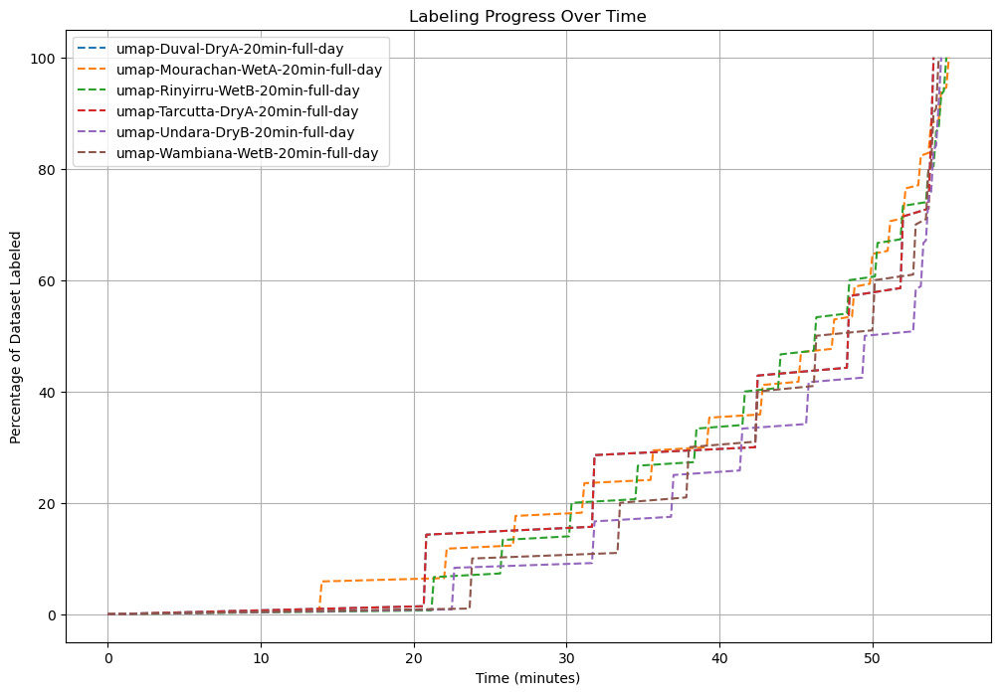

In [10]:
import matplotlib.pyplot as plt
import numpy as np

# Constants
manual_time_per_sample = 120 / (30 / 4.5)  # Time per 4.5-second sample in seconds
software_time_per_sample = 10  # Time per 4.5-second sample in seconds
proportion_to_label = 0.1  # 10% of the cluster

# Specific cluster sizes for each dataset
dataset_clusters = {
    "umap-Duval-DryA-20min-full-day.csv": [1245, 658, 636, 356, 200, 102, 7],
    "umap-Mourachan-WetA-20min-full-day.csv": [837, 483, 269, 264, 261, 212, 204, 144, 120, 78, 68, 64, 55, 51, 35, 34, 25],
    "umap-Rinyirru-WetB-20min-full-day.csv": [1278, 267, 266, 257, 228, 185, 137, 131, 121, 101, 91, 90, 29, 12, 11],
    "umap-Tarcutta-DryA-20min-full-day.csv": [1245, 658, 636, 356, 200, 102, 7],
    "umap-Undara-DryB-20min-full-day.csv": [1350, 541, 303, 266, 254, 215, 198, 29, 18, 15, 10, 5],
    "umap-Wambiana-WetB-20min-full-day.csv": [1426, 578, 268, 265, 223, 223, 151, 42, 16, 12],
}

# Function to simulate non-linear labeling time for a given list of clusters
def simulate_labeling_time(clusters):
    time_points = [0]  # Start with 0 time
    label_percentages = [0]  # Start with 0% labeled
    
    for cluster in clusters:
        manual_label_points = int(cluster * proportion_to_label)
        # Time for manual labeling of 10%
        for _ in range(manual_label_points):
            time_points.append(time_points[-1] + software_time_per_sample)
            label_percentages.append(label_percentages[-1] + 100 * (1/len(clusters)) * (1/cluster))
        
        # Simulate gradual application of labels to the remaining 90%
        remaining_points = cluster - manual_label_points
        for _ in range(remaining_points):
            time_points.append(time_points[-1] + (software_time_per_sample / remaining_points))
            label_percentages.append(label_percentages[-1] + 100 * (1/len(clusters)) * (1/cluster))
    
    return time_points, label_percentages

# Plotting
plt.figure(figsize=(12, 8))

for dataset, clusters in dataset_clusters.items():
    time_points, label_percentages = simulate_labeling_time(clusters)
    # Convert time to minutes
    time_points = [t / 60 for t in time_points]
    plt.plot(time_points, label_percentages, label=dataset[:-4], linestyle='--')

plt.xlabel('Time (minutes)')
plt.ylabel('Percentage of Dataset Labeled')
plt.title('Labeling Progress Over Time')
plt.legend()
plt.grid(True)
plt.show()


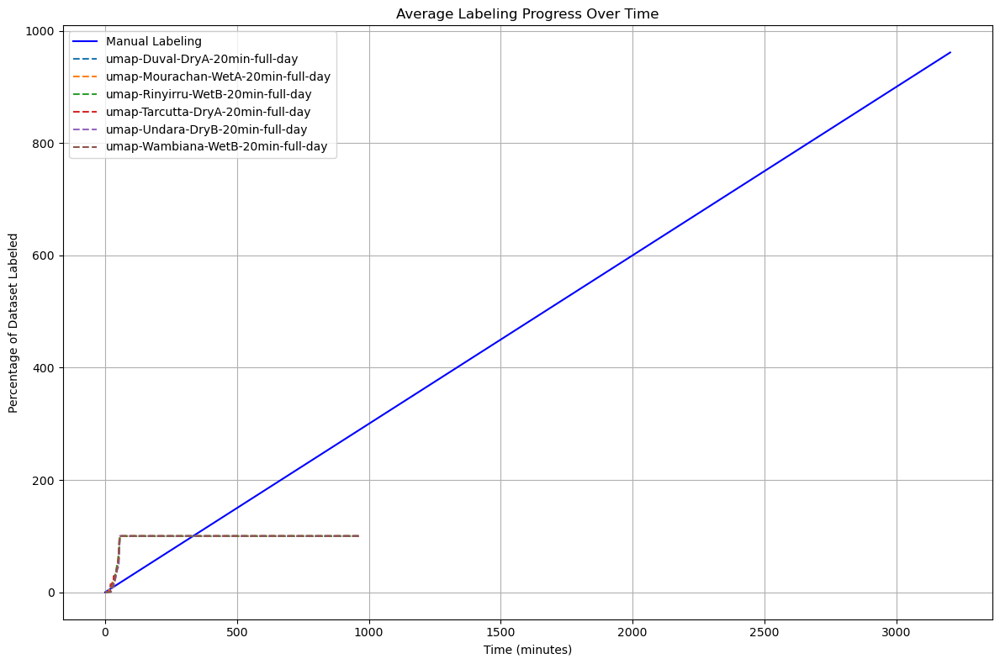

In [13]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.interpolate import interp1d

# Constants
manual_time_per_sample = 120 / (30 / 4.5) / 60  # Convert to minutes for 4.5-second samples
software_time_per_sample = 10 / 60  # Convert to minutes

# Constants
total_samples = 3205
proportion_to_label = 0.1  # 10% of the cluster

# Manual labeling time for all samples
manual_labeling_time = np.linspace(0, total_samples * manual_time_per_sample, total_samples)

# Specific cluster sizes for each dataset
dataset_clusters = {
    "umap-Duval-DryA-20min-full-day.csv": [1245, 658, 636, 356, 200, 102, 7],
    "umap-Mourachan-WetA-20min-full-day.csv": [837, 483, 269, 264, 261, 212, 204, 144, 120, 78, 68, 64, 55, 51, 35, 34, 25],
    "umap-Rinyirru-WetB-20min-full-day.csv": [1278, 267, 266, 257, 228, 185, 137, 131, 121, 101, 91, 90, 29, 12, 11],
    "umap-Tarcutta-DryA-20min-full-day.csv": [1245, 658, 636, 356, 200, 102, 7],
    "umap-Undara-DryB-20min-full-day.csv": [1350, 541, 303, 266, 254, 215, 198, 29, 18, 15, 10, 5],
    "umap-Wambiana-WetB-20min-full-day.csv": [1426, 578, 268, 265, 223, 223, 151, 42, 16, 12],
}

# Plotting
plt.figure(figsize=(12, 8))
plt.plot(range(total_samples), manual_labeling_time, label='Manual Labeling', color='blue')

# Common time points for interpolation and averaging
common_time_points = np.linspace(0, max(sum(clusters) for clusters in dataset_clusters.values()) * manual_time_per_sample, 500)

for dataset, clusters in dataset_clusters.items():
    total_samples = sum(clusters)
    interpolated_percentages = []

    # Generate and interpolate labeling curves for each cluster configuration
    for _ in range(10):  # Simulate multiple runs to average
        time_points, label_percentages = simulate_labeling_time(clusters)
        interpolate = interp1d(time_points, label_percentages, kind='nearest', bounds_error=False, fill_value="extrapolate")
        interpolated_percentages.append(interpolate(common_time_points))

    # Calculate the average curve
    average_percentage = np.mean(interpolated_percentages, axis=0)

    # Plot the average curve
    plt.plot(common_time_points, average_percentage, label=dataset[:-4], linestyle='--')

    # Manual labeling line, truncated at the point where it exceeds the software-assisted line
    manual_labeling_time = np.linspace(0, total_samples * manual_time_per_sample, total_samples)
    percentage_labeled_manual = np.linspace(0, 100, total_samples)
    cutoff_index = np.where(manual_labeling_time > common_time_points[np.argmax(average_percentage >= percentage_labeled_manual[:len(common_time_points)])])[0][0]
    plt.plot(manual_labeling_time[:cutoff_index], percentage_labeled_manual[:cutoff_index], color='black', linestyle='-', linewidth=1)

plt.xlabel('Time (minutes)')
plt.ylabel('Percentage of Dataset Labeled')
plt.title('Average Labeling Progress Over Time')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


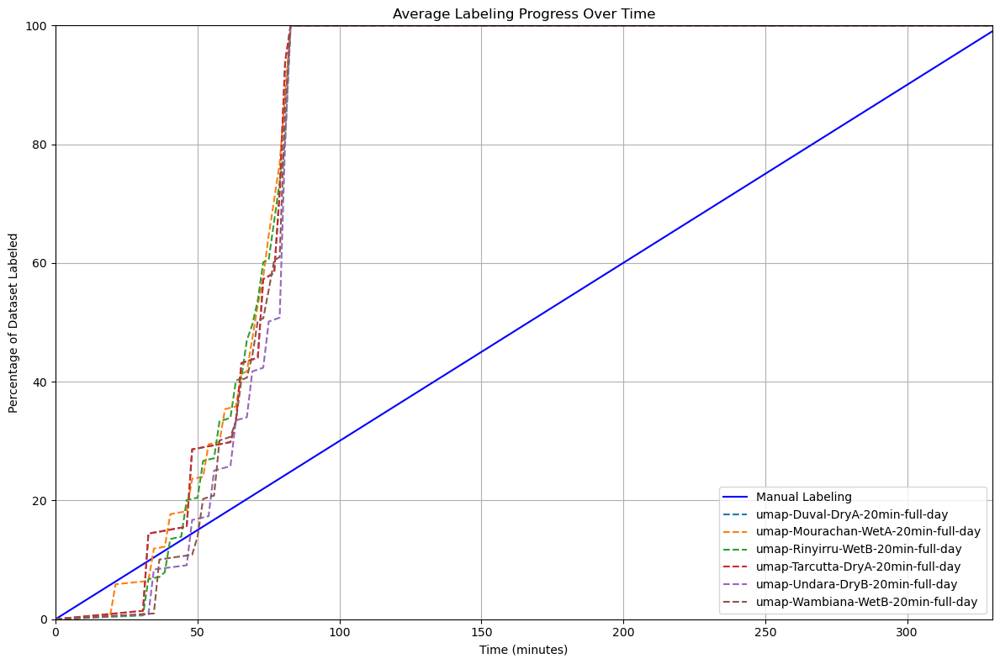

In [14]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.interpolate import interp1d

# Constants
manual_time_per_sample = 120 / (30 / 4.5) / 60  # Convert to minutes for 4.5-second samples
software_time_per_sample = 15 / 60  # Convert to minutes

# Constants
total_samples = 3205
proportion_to_label = 0.1  # 10% of the cluster

# Manual labeling time for all samples
manual_labeling_time = np.linspace(0, total_samples * manual_time_per_sample, total_samples)

# Specific cluster sizes for each dataset
dataset_clusters = {
    "umap-Duval-DryA-20min-full-day.csv": [1245, 658, 636, 356, 200, 102, 7],
    "umap-Mourachan-WetA-20min-full-day.csv": [837, 483, 269, 264, 261, 212, 204, 144, 120, 78, 68, 64, 55, 51, 35, 34, 25],
    "umap-Rinyirru-WetB-20min-full-day.csv": [1278, 267, 266, 257, 228, 185, 137, 131, 121, 101, 91, 90, 29, 12, 11],
    "umap-Tarcutta-DryA-20min-full-day.csv": [1245, 658, 636, 356, 200, 102, 7],
    "umap-Undara-DryB-20min-full-day.csv": [1350, 541, 303, 266, 254, 215, 198, 29, 18, 15, 10, 5],
    "umap-Wambiana-WetB-20min-full-day.csv": [1426, 578, 268, 265, 223, 223, 151, 42, 16, 12],
}

# Plotting
plt.figure(figsize=(12, 8))
plt.plot(range(total_samples), manual_labeling_time, label='Manual Labeling', color='blue')

# Common time points for interpolation and averaging
common_time_points = np.linspace(0, max(sum(clusters) for clusters in dataset_clusters.values()) * manual_time_per_sample, 500)

for dataset, clusters in dataset_clusters.items():
    total_samples = sum(clusters)
    interpolated_percentages = []

    # Generate and interpolate labeling curves for each cluster configuration
    for _ in range(10):  # Simulate multiple runs to average
        time_points, label_percentages = simulate_labeling_time(clusters)
        interpolate = interp1d(time_points, label_percentages, kind='nearest', bounds_error=False, fill_value="extrapolate")
        interpolated_percentages.append(interpolate(common_time_points))

    # Calculate the average curve
    average_percentage = np.mean(interpolated_percentages, axis=0)

    # Plot the average curve
    plt.plot(common_time_points, average_percentage, label=dataset[:-4], linestyle='--')

    # Manual labeling line, truncated at the point where it exceeds the software-assisted line
    manual_labeling_time = np.linspace(0, total_samples * manual_time_per_sample, total_samples)
    percentage_labeled_manual = np.linspace(0, 100, total_samples)
    cutoff_index = np.where(manual_labeling_time > common_time_points[np.argmax(average_percentage >= percentage_labeled_manual[:len(common_time_points)])])[0][0]
    plt.plot(manual_labeling_time[:cutoff_index], percentage_labeled_manual[:cutoff_index], color='black', linestyle='-', linewidth=1)

plt.xlabel('Time (minutes)')
plt.ylabel('Percentage of Dataset Labeled')
plt.title('Average Labeling Progress Over Time')
plt.xlim(0, 330)  # Set the x-axis limit
plt.ylim(0, 100)  # Set the y-axis limit

plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()

TypeError: simulate_labeling_time() missing 2 required positional arguments: 'software_time_per_sample' and 'proportion_to_label'

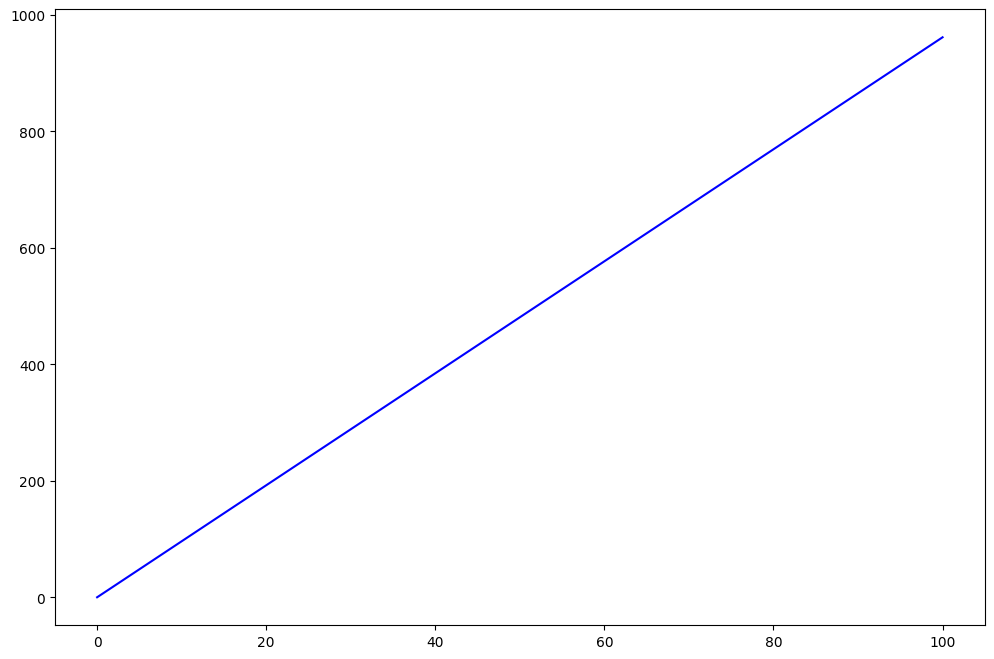

In [10]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.interpolate import interp1d

# Constants
manual_time_per_sample = 120 / (30 / 4.5) / 60  # Convert to minutes for 4.5-second samples
software_time_per_sample = 15 / 60  # Convert to minutes

# Constants
total_samples = 3205
proportion_to_label = 0.1  # 10% of the cluster

# Manual labeling time for all samples
manual_labeling_time = np.linspace(0, total_samples * manual_time_per_sample, total_samples)

# Specific cluster sizes for each dataset
dataset_clusters = {
    "Duval-DryA.csv": [1245, 658, 636, 356, 200, 102, 7],
    "Mourachan-WetA.csv": [837, 483, 269, 264, 261, 212, 204, 144, 120, 78, 68, 64, 55, 51, 35, 34, 25],
    "Rinyirru-WetB.csv": [1278, 267, 266, 257, 228, 185, 137, 131, 121, 101, 91, 90, 29, 12, 11],
    "Tarcutta-DryA.csv": [1245, 658, 636, 356, 200, 102, 7],
    "Undara-DryB.csv": [1350, 541, 303, 266, 254, 215, 198, 29, 18, 15, 10, 5],
    "Wambiana-WetB.csv": [1426, 578, 268, 265, 223, 223, 151, 42, 16, 12],
}

# Plotting
plt.figure(figsize=(12, 8))

# For manual labeling, now time is on the y-axis and percentage on the x-axis
plt.plot(np.linspace(0, 100, total_samples), manual_labeling_time, label='Manual Labelling', color='blue')

# Common time points for interpolation and averaging
common_time_points = np.linspace(0, max(sum(clusters) for clusters in dataset_clusters.values()) * manual_time_per_sample, 500)

for dataset, clusters in dataset_clusters.items():
    total_samples = sum(clusters)
    interpolated_percentages = []

    # Generate and interpolate labeling curves for each cluster configuration
    for _ in range(10):  # Simulate multiple runs to average
        time_points, label_percentages = simulate_labeling_time(clusters)
        interpolate = interp1d(time_points, label_percentages, kind='nearest', bounds_error=False, fill_value="extrapolate")
        interpolated_percentages.append(interpolate(common_time_points))

    # Calculate the average curve
    average_percentage = np.mean(interpolated_percentages, axis=0)

    # Now plotting with reversed axes
    plt.plot(average_percentage, common_time_points, label=dataset[:-4], linestyle='--')

    # Adjustments for manual labeling line with reversed axes
    percentage_labeled_manual = np.linspace(0, 100, total_samples)
    cutoff_index = np.where(manual_labeling_time > common_time_points[np.argmax(average_percentage >= percentage_labeled_manual[:len(common_time_points)])])[0][0]
    plt.plot(percentage_labeled_manual[:cutoff_index], manual_labeling_time[:cutoff_index], color='black', linestyle='-', linewidth=1)

# Adjust labels and limits for the reversed axes
plt.ylabel('Time (minutes)')
plt.xlabel('Percentage of Dataset Labeled')
plt.title('Average Labelling Progress Over Time')
plt.ylim(0, 100)  # Adjusted for the y-axis now
plt.xlim(0, 100)  # Adjusted for the x-axis now

plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [19]:
# Constants for manual labeling
manual_time_per_sample = 120 / (30 / 4.5) / 60  # Convert to minutes for 4.5-second samples

# Total number of samples
total_samples = 3205

# Calculate total manual labeling time for all samples
manual_labeling_time_all_samples = total_samples * manual_time_per_sample
manual_labeling_time_all_samples


961.5

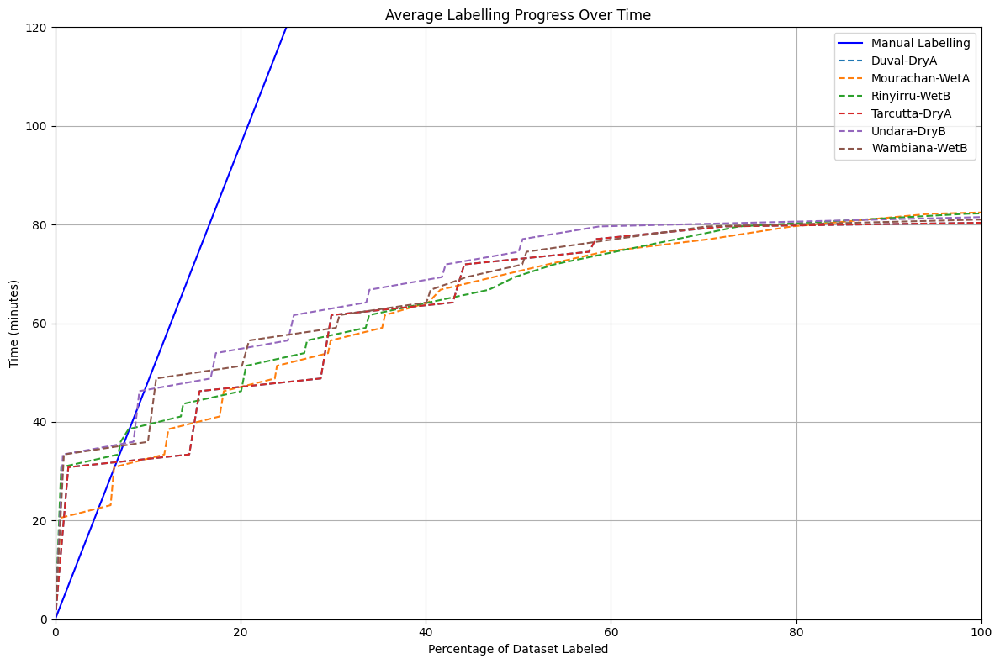

In [26]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.interpolate import interp1d

# Constants
average_listening_time_per_sample = 9  # Average listening time per sample in seconds
manual_time_per_sample = average_listening_time_per_sample / 60  # Convert to minutes for a 4.5-second sample
software_time_per_sample = 15 / 60  # Convert to minutes

# Total number of samples
total_samples = 3205
# Proportion of samples to label manually in a semi-supervised approach
proportion_to_label = 0.1  # 10% of the cluster

# Manual labeling time for all samples
manual_labeling_time = np.linspace(0, total_samples * manual_time_per_sample, total_samples)

# Specific cluster sizes for each dataset
dataset_clusters = {
    "Duval-DryA.csv": [1245, 658, 636, 356, 200, 102, 7],
    "Mourachan-WetA.csv": [837, 483, 269, 264, 261, 212, 204, 144, 120, 78, 68, 64, 55, 51, 35, 34, 25],
    "Rinyirru-WetB.csv": [1278, 267, 266, 257, 228, 185, 137, 131, 121, 101, 91, 90, 29, 12, 11],
    "Tarcutta-DryA.csv": [1245, 658, 636, 356, 200, 102, 7],
    "Undara-DryB.csv": [1350, 541, 303, 266, 254, 215, 198, 29, 18, 15, 10, 5],
    "Wambiana-WetB.csv": [1426, 578, 268, 265, 223, 223, 151, 42, 16, 12],
}

def simulate_labeling_time(clusters, software_time_per_sample, proportion_to_label):
    """Simulate the non-linear labeling time for a given list of clusters."""
    time_points = [0]  # Start with 0 time
    label_percentages = [0]  # Start with 0% labeled
    
    for cluster in clusters:
        manual_label_points = int(cluster * proportion_to_label)
        # Time for manual labeling of 10%
        for _ in range(manual_label_points):
            time_points.append(time_points[-1] + software_time_per_sample)
            label_percentages.append(label_percentages[-1] + 100 * (1 / len(clusters)) * (1 / cluster))
        
        # Simulate gradual application of labels to the remaining 90%
        remaining_points = cluster - manual_label_points
        for _ in range(remaining_points):
            time_points.append(time_points[-1] + (software_time_per_sample / remaining_points))
            label_percentages.append(label_percentages[-1] + 100 * (1 / len(clusters)) * (1 / cluster))
    
    return time_points, label_percentages

# Plotting
plt.figure(figsize=(12, 8))

# Manual labeling time as percentage
plt.plot(np.linspace(0, 100, total_samples), manual_labeling_time, label='Manual Labelling', color='blue')

# Common time points for interpolation and averaging
common_time_points = np.linspace(0, max(sum(clusters) for clusters in dataset_clusters.values()) * (manual_time_per_sample + software_time_per_sample), 500)

for dataset, clusters in dataset_clusters.items():
    total_samples = sum(clusters)
    interpolated_percentages = []

    # Generate and interpolate labeling curves for each cluster configuration
    for _ in range(10):  # Simulate multiple runs to average
        time_points, label_percentages = simulate_labeling_time(clusters, software_time_per_sample, proportion_to_label)
        interpolate = interp1d(time_points, label_percentages, kind='linear', bounds_error=False, fill_value="extrapolate")
        interpolated_percentages.append(interpolate(common_time_points))

    # Calculate the average curve
    average_percentage = np.mean(interpolated_percentages, axis=0)

    # Plotting with reversed axes
    plt.plot(average_percentage, common_time_points, label=dataset[:-4], linestyle='--')

# Adjust labels and limits for the axes
plt.ylabel('Time (minutes)')
plt.xlabel('Percentage of Dataset Labelled')
plt.title('Average Labelling Progress Over Time')
plt.ylim(0, 120)  # Adjusted for the y-axis now
plt.xlim(0, 100)  # Adjusted for the x-axis now

plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


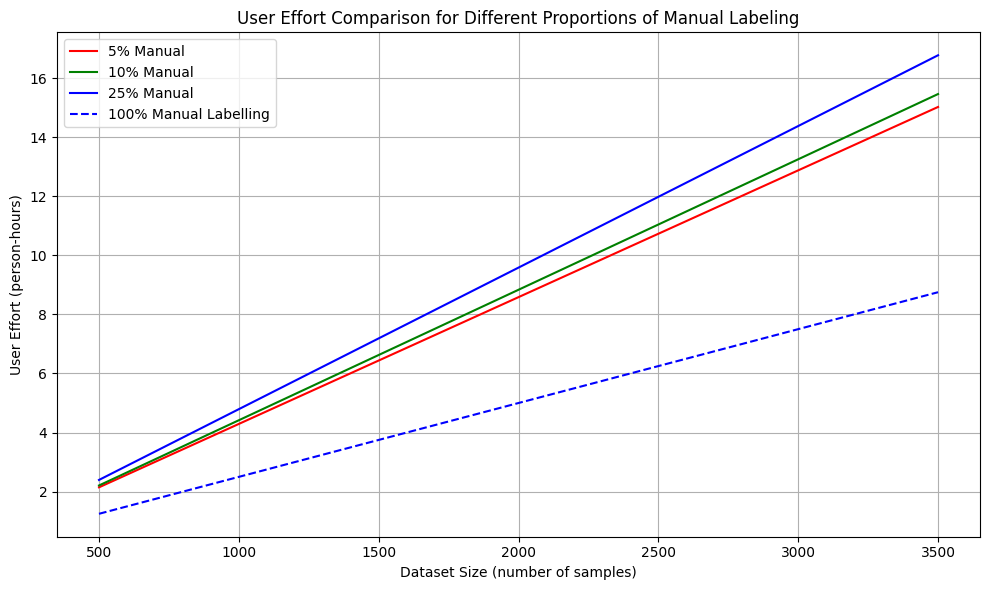

In [38]:
proportions = [0.05, 0.1, 0.25]
colors = ['red', 'green', 'blue']
labels = ['5% Manual', '10% Manual', '25% Manual']

plt.figure(figsize=(10, 6))

for proportion, color, label in zip(proportions, colors, labels):
    software_effort_proportion = (dataset_sizes * software_time_per_sample + (dataset_sizes * proportion * manual_time_per_sample)) / 60  # Person-hours
    plt.plot(dataset_sizes, software_effort_proportion, label=label, color=color)

plt.plot(dataset_sizes, manual_effort, label='100% Manual Labelling', color='blue', linestyle='--')
plt.xlabel('Dataset Size (number of samples)')
plt.ylabel('User Effort (person-hours)')
plt.title('User Effort Comparison for Different Proportions of Manual Labeling')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [ ]:
import numpy as np
from scipy.spatial.distance import cdist

def optimized_dunn_index(clusters):
    if len(clusters) < 2:
        return 0  # Dunn index is not defined for less than 2 clusters

    # Calculate all pairwise inter-cluster distances and find the minimum
    min_inter_cluster_dist = np.inf
    for i in range(len(clusters) - 1):
        for j in range(i + 1, len(clusters)):
            dist_matrix = cdist(clusters[i], clusters[j], metric='euclidean')
            min_inter_cluster_dist = min(min_inter_cluster_dist, np.min(dist_matrix))

    # Calculate all intra-cluster distances and find the maximum
    max_intra_cluster_dist = 0
    for cluster in clusters:
        if len(cluster) > 1:
            dist_matrix = cdist(cluster, cluster, metric='euclidean')
            max_intra_cluster_dist = max(max_intra_cluster_dist, np.max(dist_matrix))

    return min_inter_cluster_dist / max_intra_cluster_dist if max_intra_cluster_dist != 0 else 0

# Update the function to use the optimized Dunn index calculation
def calculate_dunn_index_optimized(filepath):
    df = pd.read_csv(filepath, usecols=[0, 1, 2, 3], header=None, skiprows=1)
    df.columns = ['x', 'y', 'z', 'class_label']
    clusters = [df[df['class_label'] == label].iloc[:, 0:3].values for label in df['class_label'].unique()]
    return optimized_dunn_index(clusters)

# Recalculate the Dunn indices with the optimized function
dunn_indices_optimized = {filepath.split('/')[-1]: calculate_dunn_index_optimized(filepath) for filepath in filepaths}
dunn_indices_optimized


{'C:\\Users\\Thomas\\A2OAudioLabeller\\A2OAudioLabeller\\data\\umap-Duval-DryA-20min-full-day.csv': 0.060837816613385345,
 'C:\\Users\\Thomas\\A2OAudioLabeller\\A2OAudioLabeller\\data\\umap-Mourachan-WetA-20min-full-day.csv': 0.060065100442752865,
 'C:\\Users\\Thomas\\A2OAudioLabeller\\A2OAudioLabeller\\data\\umap-Rinyirru-WetB-20min-full-day.csv': 0.07112131751258327,
 'C:\\Users\\Thomas\\A2OAudioLabeller\\A2OAudioLabeller\\data\\umap-Tarcutta-DryA-20min-full-day.csv': 0.060837816613385345,
 'C:\\Users\\Thomas\\A2OAudioLabeller\\A2OAudioLabeller\\data\\umap-Undara-DryB-20min-full-day.csv': 0.048279004760676314,
 'C:\\Users\\Thomas\\A2OAudioLabeller\\A2OAudioLabeller\\data\\umap-Wambiana-WetB-20min-full-day.csv': 0.12924697211728728}

In [ ]:
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score

# Function to calculate clustering metrics for a given dataset
def calculate_clustering_metrics(filepath):
    # Load the dataset, skipping the first row with redundant column names
    df = pd.read_csv(filepath, usecols=[0, 1, 2, 3], header=None, skiprows=1)
    df.columns = ['x', 'y', 'z', 'class_label']
    
    # Extract the features and labels
    features = df.iloc[:, 0:3]
    labels = df['class_label']
    
    # Calculate metrics
    silhouette_coefficient = silhouette_score(features, labels)
    calinski_harabasz = calinski_harabasz_score(features, labels)
    davies_bouldin = davies_bouldin_score(features, labels)
    
    # Prepare clusters for Dunn index calculation
    clusters = [df[df['class_label'] == label].iloc[:, 0:3].values for label in df['class_label'].unique()]
    dunn_index_value = optimized_dunn_index(clusters)
    
    return {
        'Silhouette Coefficient': silhouette_coefficient,
        'Calinski-Harabasz Index': calinski_harabasz,
        'Davies-Bouldin Index': davies_bouldin,
        'Dunn Index': dunn_index_value
    }

# Filepaths to the datasets
filepaths = [
    'C:\\Users\\Thomas\\A2OAudioLabeller\\A2OAudioLabeller\\data\\umap-Duval-DryA-20min-full-day.csv',
    'C:\\Users\\Thomas\\A2OAudioLabeller\\A2OAudioLabeller\\data\\umap-Mourachan-WetA-20min-full-day.csv',
    'C:\\Users\\Thomas\\A2OAudioLabeller\\A2OAudioLabeller\\data\\umap-Rinyirru-WetB-20min-full-day.csv',
    'C:\\Users\\Thomas\\A2OAudioLabeller\\A2OAudioLabeller\\data\\umap-Tarcutta-DryA-20min-full-day.csv',
    'C:\\Users\\Thomas\\A2OAudioLabeller\\A2OAudioLabeller\\data\\umap-Undara-DryB-20min-full-day.csv',
    'C:\\Users\\Thomas\\A2OAudioLabeller\\A2OAudioLabeller\\data\\umap-Wambiana-WetB-20min-full-day.csv'
]

# Calculate and store the clustering metrics for each dataset
clustering_metrics = {filepath.split('/')[-1]: calculate_clustering_metrics(filepath) for filepath in filepaths}
clustering_metrics


NameError: name 'pd' is not defined

In [57]:
from sklearn.metrics import silhouette_score, calinski_harabasz_score, davies_bouldin_score
from scipy.spatial.distance import pdist, squareform
import numpy as np
from sklearn.cluster import DBSCAN
from sklearn.preprocessing import StandardScaler
import pandas as pd

# Function to compute Dunn index
def dunn_index(X, labels):
    distances = squareform(pdist(X))
    np.fill_diagonal(distances, np.inf)
    inter_cluster = np.min(distances[np.where(labels[:, None] != labels[None, :])])
    intra_cluster = max([np.max(pdist(X[labels == i])) for i in np.unique(labels) if i != -1])
    return inter_cluster / intra_cluster if intra_cluster != 0 else 0

# Function to normalize metrics to a 0-1 range, inverting Davies-Bouldin as we aim to minimize it
def normalize_and_calculate_composite_score(silhouette, calinski, davies, dunn, metrics_ranges):
    normalized_silhouette = (silhouette - metrics_ranges['silhouette']['min']) / (metrics_ranges['silhouette']['max'] - metrics_ranges['silhouette']['min'])
    normalized_calinski = (calinski - metrics_ranges['calinski']['min']) / (metrics_ranges['calinski']['max'] - metrics_ranges['calinski']['min'])
    normalized_davies = 1 - ((davies - metrics_ranges['davies']['min']) / (metrics_ranges['davies']['max'] - metrics_ranges['davies']['min']))
    normalized_dunn = (dunn - metrics_ranges['dunn']['min']) / (metrics_ranges['dunn']['max'] - metrics_ranges['dunn']['min'])

    # Composite score calculation
    composite_score = normalized_silhouette + normalized_calinski + normalized_davies + normalized_dunn
    return normalized_silhouette, normalized_calinski, normalized_davies, normalized_dunn, composite_score

# Function to optimize DBSCAN and evaluate using the combined metrics strategy
def optimize_and_evaluate_combined(filenames):
    results = []

    for filename in filenames:
        data = pd.read_csv(filename)
        X = data.iloc[:, :3]  # Only the first three columns
        X_scaled = StandardScaler().fit_transform(X)

        best_score = -1
        best_params = {}
        metrics_ranges = {
            'silhouette': {'min': float('inf'), 'max': float('-inf')},
            'calinski': {'min': float('inf'), 'max': float('-inf')},
            'davies': {'min': float('inf'), 'max': float('-inf')},
            'dunn': {'min': float('inf'), 'max': float('-inf')}
        }

        # First pass: determine the range of each metric
        for eps in np.arange(0.1, 1.5, 0.1):
            for min_samples in range(2, 10):
                db = DBSCAN(eps=eps, min_samples=min_samples).fit(X_scaled)
                labels = db.labels_
                
                # Skipping evaluation if only one or no cluster found
                if len(set(labels)) <= 1 or (len(set(labels)) == 2 and -1 in labels):
                    continue

                silhouette = silhouette_score(X_scaled, labels)
                calinski = calinski_harabasz_score(X_scaled, labels)
                davies = davies_bouldin_score(X_scaled, labels)
                dunn = dunn_index(X_scaled, labels)

                metrics_ranges['silhouette']['min'] = min(metrics_ranges['silhouette']['min'], silhouette)
                metrics_ranges['silhouette']['max'] = max(metrics_ranges['silhouette']['max'], silhouette)
                metrics_ranges['calinski']['min'] = min(metrics_ranges['calinski']['min'], calinski)
                metrics_ranges['calinski']['max'] = max(metrics_ranges['calinski']['max'], calinski)
                metrics_ranges['davies']['min'] = min(metrics_ranges['davies']['min'], davies)
                metrics_ranges['davies']['max'] = max(metrics_ranges['davies']['max'], davies)
                metrics_ranges['dunn']['min'] = min(metrics_ranges['dunn']['min'], dunn)
                metrics_ranges['dunn']['max'] = max(metrics_ranges['dunn']['max'], dunn)

        # Second pass: calculate the composite score using the ranges determined in the first pass
        for eps in np.arange(0.1, 1.5, 0.1):
            for min_samples in range(2, 10):
                db = DBSCAN(eps=eps, min_samples=min_samples).fit(X_scaled)
                labels = db.labels_
                
                # Skipping evaluation if only one or no cluster found
                if len(set(labels)) <= 1 or (len(set(labels)) == 2 and -1 in labels):
                    continue

                silhouette = silhouette_score(X_scaled, labels)
                calinski = calinski_harabasz_score(X_scaled, labels)
                davies = davies_bouldin_score(X_scaled, labels)
                dunn = dunn_index(X_scaled, labels)

                normalized_silhouette, normalized_calinski, normalized_davies, normalized_dunn, composite_score = normalize_and_calculate_composite_score(silhouette, calinski, davies, dunn, metrics_ranges)

                if composite_score > best_score:
                    best_score = composite_score
                    best_params = {
                        'eps': eps,
                        'min_samples': min_samples,
                        'Silhouette': silhouette,
                        'Calinski-Harabasz': calinski,
                        'Davies-Bouldin': davies,
                        'Dunn': dunn,
                        'Composite Score': composite_score  # Add the composite score to the best params
                    }

        results.append({filename: best_params})

    return results

# List of dataset filenames
filenames = [
    'C:\\Users\\Thomas\\A2OAudioLabeller\\A2OAudioLabeller\\data\\umap-Duval-DryA-20min-full-day.csv',
    'C:\\Users\\Thomas\\A2OAudioLabeller\\A2OAudioLabeller\\data\\umap-Mourachan-WetA-20min-full-day.csv',
    'C:\\Users\\Thomas\\A2OAudioLabeller\\A2OAudioLabeller\\data\\umap-Rinyirru-WetB-20min-full-day.csv',
    'C:\\Users\\Thomas\\A2OAudioLabeller\\A2OAudioLabeller\\data\\umap-Tarcutta-DryA-20min-full-day.csv',
    'C:\\Users\\Thomas\\A2OAudioLabeller\\A2OAudioLabeller\\data\\umap-Undara-DryB-20min-full-day.csv',
    'C:\\Users\\Thomas\\A2OAudioLabeller\\A2OAudioLabeller\\data\\umap-Wambiana-WetB-20min-full-day.csv'
]


# Optimizing DBSCAN and evaluating models
results = optimize_and_evaluate_combined(filenames)
print(results)

[{'C:\\Users\\Thomas\\A2OAudioLabeller\\A2OAudioLabeller\\data\\umap-Duval-DryA-20min-full-day.csv': {'eps': 0.6, 'min_samples': 2, 'Silhouette': 0.3971673046497621, 'Calinski-Harabasz': 665.011572092055, 'Davies-Bouldin': 0.637009944604939, 'Dunn': 0.321923847658723, 'Composite Score': 3.1234807975482264}}, {'C:\\Users\\Thomas\\A2OAudioLabeller\\A2OAudioLabeller\\data\\umap-Mourachan-WetA-20min-full-day.csv': {'eps': 0.6, 'min_samples': 2, 'Silhouette': 0.7325944153323012, 'Calinski-Harabasz': 6481.302612426547, 'Davies-Bouldin': 0.3591332479532416, 'Dunn': 0.4167354877115795, 'Composite Score': 3.9316198415197814}}, {'C:\\Users\\Thomas\\A2OAudioLabeller\\A2OAudioLabeller\\data\\umap-Rinyirru-WetB-20min-full-day.csv': {'eps': 0.4, 'min_samples': 2, 'Silhouette': 0.65431355688035, 'Calinski-Harabasz': 4620.008014923997, 'Davies-Bouldin': 0.3242395877815967, 'Dunn': 0.3773511209192195, 'Composite Score': 3.217044278001304}}, {'C:\\Users\\Thomas\\A2OAudioLabeller\\A2OAudioLabeller\\data\

In [ ]:
from sklearn.cluster import KMeans
from sklearn.metrics import silhouette_score

# Function to find the optimal number of clusters using the silhouette coefficient
def find_optimal_clusters_kmeans(data, max_clusters=10):
    silhouette_scores = []
    for n_clusters in range(2, max_clusters + 1):
        kmeans = KMeans(n_clusters=n_clusters, random_state=42).fit(data)
        score = silhouette_score(data, kmeans.labels_)
        silhouette_scores.append((n_clusters, score))
    
    # Find the number of clusters that gives the highest silhouette score
    optimal_n_clusters = sorted(silhouette_scores, key=lambda x: x[1], reverse=True)[0][0]
    return optimal_n_clusters

# Function to perform clustering and calculate metrics
def clustering_metrics_kmeans(filepath, max_clusters=10):
    # Load the dataset and use only the first 3 columns
    df = pd.read_csv(filepath, usecols=[0, 1, 2], header=None, skiprows=1)
    
    # Find the optimal number of clusters using silhouette coefficient
    optimal_n_clusters = find_optimal_clusters_kmeans(df, max_clusters)
    
    # Perform K-Means clustering with the optimal number of clusters
    kmeans = KMeans(n_clusters=optimal_n_clusters, random_state=42).fit(df)
    labels = kmeans.labels_
    
    # Calculate metrics
    silhouette_coefficient = silhouette_score(df, labels)
    calinski_harabasz = calinski_harabasz_score(df, labels)
    davies_bouldin = davies_bouldin_score(df, labels)
    
    # Prepare clusters for Dunn index calculation
    clusters = [df[labels == label].values for label in set(labels)]
    dunn_index_value = optimized_dunn_index(clusters)
    
    return {
        'Optimal Clusters': optimal_n_clusters,
        'Silhouette Coefficient': silhouette_coefficient,
        'Calinski-Harabasz Index': calinski_harabasz,
        'Davies-Bouldin Index': davies_bouldin,
        'Dunn Index': dunn_index_value
    }

# Test K-Means clustering metrics calculation for the first dataset
clustering_metrics_kmeans_test = clustering_metrics_kmeans(filepaths[0])
clustering_metrics_kmeans_test


c:\Users\Thomas\conda\envs\audiohandling\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\Thomas\conda\envs\audiohandling\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\Thomas\conda\envs\audiohandling\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
c:\Users\Thomas\conda\envs\audiohandling\lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of

{'Optimal Clusters': 7,
 'Silhouette Coefficient': 0.5612913342868135,
 'Calinski-Harabasz Index': 5778.3299309993545,
 'Davies-Bouldin Index': 0.6093535775767155,
 'Dunn Index': 0.008032273355227264}

In [1]:
# Define the datasets with their metrics
datasets = {
    "Duval-DryA": {"Calinski-Harabasz": 665.01, "Dunn": 0.322, "Silhouette": 0.397, "Davies-Bouldin": 0.637},
    "Mourachan-WetA": {"Calinski-Harabasz": 6481.30, "Dunn": 0.417, "Silhouette": 0.733, "Davies-Bouldin": 0.359},
    "Rinyirru-WetB": {"Calinski-Harabasz": 4620.01, "Dunn": 0.377, "Silhouette": 0.654, "Davies-Bouldin": 0.324},
    "Tarcutta-DryA": {"Calinski-Harabasz": 665.01, "Dunn": 0.322, "Silhouette": 0.397, "Davies-Bouldin": 0.637},
    "Undara-DryB": {"Calinski-Harabasz": 1564.99, "Dunn": 0.084, "Silhouette": 0.475, "Davies-Bouldin": 0.453},
    "Wambiana-WetB": {"Calinski-Harabasz": 10160.87, "Dunn": 0.628, "Silhouette": 0.745, "Davies-Bouldin": 0.302}
}

# Define the ranges for normalization for each metric
ranges = {
    "Calinski-Harabasz": {"min": min(d["Calinski-Harabasz"] for d in datasets.values()), "max": max(d["Calinski-Harabasz"] for d in datasets.values())},
    "Dunn": {"min": min(d["Dunn"] for d in datasets.values()), "max": max(d["Dunn"] for d in datasets.values())},
    "Silhouette": {"min": min(d["Silhouette"] for d in datasets.values()), "max": max(d["Silhouette"] for d in datasets.values())},
    "Davies-Bouldin": {"min": min(d["Davies-Bouldin"] for d in datasets.values()), "max": max(d["Davies-Bouldin"] for d in datasets.values())}
}

# Function to normalize, square, and calculate the new composite score
def new_composite_score(metrics, ranges):
    # Normalizing and squaring each metric
    n_silhouette = ((metrics["Silhouette"] - ranges["Silhouette"]["min"]) / (ranges["Silhouette"]["max"] - ranges["Silhouette"]["min"]))**2
    n_calinski = ((metrics["Calinski-Harabasz"] - ranges["Calinski-Harabasz"]["min"]) / (ranges["Calinski-Harabasz"]["max"] - ranges["Calinski-Harabasz"]["min"]))**2
    n_davies = (1 - (metrics["Davies-Bouldin"] - ranges["Davies-Bouldin"]["min"]) / (ranges["Davies-Bouldin"]["max"] - ranges["Davies-Bouldin"]["min"]))**2
    n_dunn = ((metrics["Dunn"] - ranges["Dunn"]["min"]) / (ranges["Dunn"]["max"] - ranges["Dunn"]["min"]))**2
    
    # Summing the squared normalized metrics
    composite = n_silhouette + n_calinski + n_davies + n_dunn
    return composite

# Calculate the new composite score for each dataset
for name, metrics in datasets.items():
    datasets[name]["New Composite Score"] = new_composite_score(metrics, ranges)

datasets


{'Duval-DryA': {'Calinski-Harabasz': 665.01,
  'Dunn': 0.322,
  'Silhouette': 0.397,
  'Davies-Bouldin': 0.637,
  'New Composite Score': 0.19140624999999994},
 'Mourachan-WetA': {'Calinski-Harabasz': 6481.3,
  'Dunn': 0.417,
  'Silhouette': 0.733,
  'Davies-Bouldin': 0.359,
  'New Composite Score': 2.370747844085998},
 'Rinyirru-WetB': {'Calinski-Harabasz': 4620.01,
  'Dunn': 0.377,
  'Silhouette': 0.654,
  'Davies-Bouldin': 0.324,
  'New Composite Score': 1.881923344154023},
 'Tarcutta-DryA': {'Calinski-Harabasz': 665.01,
  'Dunn': 0.322,
  'Silhouette': 0.397,
  'Davies-Bouldin': 0.637,
  'New Composite Score': 0.19140624999999994},
 'Undara-DryB': {'Calinski-Harabasz': 1564.99,
  'Dunn': 0.084,
  'Silhouette': 0.475,
  'Davies-Bouldin': 0.453,
  'New Composite Score': 0.36089997113740857},
 'Wambiana-WetB': {'Calinski-Harabasz': 10160.87,
  'Dunn': 0.628,
  'Silhouette': 0.745,
  'Davies-Bouldin': 0.302,
  'New Composite Score': 4.0}}

In [2]:
# Define the datasets with their metrics from the K-Means section of the table
datasets = {
    "Duval-DryA": {"Calinski-Harabasz": 5778.33, "Dunn": 0.0001, "Silhouette": 0.5613, "Davies-Bouldin": 0.6094},
    "Mourachan-WetA": {"Calinski-Harabasz": 6725.93, "Dunn": 0.0000, "Silhouette": 0.7183, "Davies-Bouldin": 0.3958},
    "Rinyirru-WetB": {"Calinski-Harabasz": 8438.32, "Dunn": 0.0000, "Silhouette": 0.6982, "Davies-Bouldin": 0.4024},
    "Tarcutta-DryA": {"Calinski-Harabasz": 5778.33, "Dunn": 0.0001, "Silhouette": 0.5613, "Davies-Bouldin": 0.6094},
    "Undara-DryB": {"Calinski-Harabasz": 5839.83, "Dunn": 0.0000, "Silhouette": 0.6300, "Davies-Bouldin": 0.4580},
    "Wambiana-WetB": {"Calinski-Harabasz": 14222.55, "Dunn": 0.0000, "Silhouette": 0.7774, "Davies-Bouldin": 0.2667}
}

# Define the ranges for normalization for each metric
ranges = {
    "Calinski-Harabasz": {"min": 5778.33, "max": 14222.55},
    "Dunn": {"min": 0.0000, "max": 0.0001},  # Note: This range might cause issues due to the small max value
    "Silhouette": {"min": 0.5613, "max": 0.7774},
    "Davies-Bouldin": {"min": 0.2667, "max": 0.6094}
}

# Function to normalize, square, and calculate the new composite score
def new_composite_score(metrics, ranges):
    # Normalizing and squaring each metric
    n_silhouette = ((metrics["Silhouette"] - ranges["Silhouette"]["min"]) / (ranges["Silhouette"]["max"] - ranges["Silhouette"]["min"]))**2
    n_calinski = ((metrics["Calinski-Harabasz"] - ranges["Calinski-Harabasz"]["min"]) / (ranges["Calinski-Harabasz"]["max"] - ranges["Calinski-Harabasz"]["min"]))**2
    n_davies = (1 - (metrics["Davies-Bouldin"] - ranges["Davies-Bouldin"]["min"]) / (ranges["Davies-Bouldin"]["max"] - ranges["Davies-Bouldin"]["min"]))**2
    n_dunn = ((metrics["Dunn"] - ranges["Dunn"]["min"]) / (ranges["Dunn"]["max"] - ranges["Dunn"]["min"]))**2
    
    # Summing the squared normalized metrics
    composite = n_silhouette + n_calinski + n_davies + n_dunn
    return composite

# Calculate the new composite score for each dataset
for name, metrics in datasets.items():
    datasets[name]["New Composite Score"] = new_composite_score(metrics, ranges)

datasets


{'Duval-DryA': {'Calinski-Harabasz': 5778.33,
  'Dunn': 0.0001,
  'Silhouette': 0.5613,
  'Davies-Bouldin': 0.6094,
  'New Composite Score': 1.0},
 'Mourachan-WetA': {'Calinski-Harabasz': 6725.93,
  'Dunn': 0.0,
  'Silhouette': 0.7183,
  'Davies-Bouldin': 0.3958,
  'New Composite Score': 0.9289028572528414},
 'Rinyirru-WetB': {'Calinski-Harabasz': 8438.32,
  'Dunn': 0.0,
  'Silhouette': 0.6982,
  'Davies-Bouldin': 0.4024,
  'New Composite Score': 0.8654040199385953},
 'Tarcutta-DryA': {'Calinski-Harabasz': 5778.33,
  'Dunn': 0.0001,
  'Silhouette': 0.5613,
  'Davies-Bouldin': 0.6094,
  'New Composite Score': 1.0},
 'Undara-DryB': {'Calinski-Harabasz': 5839.83,
  'Dunn': 0.0,
  'Silhouette': 0.63,
  'Davies-Bouldin': 0.458,
  'New Composite Score': 0.29629348817648216},
 'Wambiana-WetB': {'Calinski-Harabasz': 14222.55,
  'Dunn': 0.0,
  'Silhouette': 0.7774,
  'Davies-Bouldin': 0.2667,
  'New Composite Score': 3.0}}

In [6]:
# Recalculating the composite score with the provided values and ranges

values = {
    "Calinski-Harabasz": 5778.33,
    "Dunn": 0.0001,
    "Silhouette": 0.5613,
    "Davies-Bouldin": 0.6094
}

ranges = {
    "Calinski-Harabasz": {"min": 5778.33, "max": 14222.55},
    "Dunn": {"min": 0.0000, "max": 0.0001},  # Small range might affect calculation
    "Silhouette": {"min": 0.5613, "max": 0.7774},
    "Davies-Bouldin": {"min": 0.2667, "max": 0.6094}
}

# Normalizing and squaring each metric
N_Calinski_Harabasz = (values["Calinski-Harabasz"] - ranges["Calinski-Harabasz"]["min"]) / (ranges["Calinski-Harabasz"]["max"] - ranges["Calinski-Harabasz"]["min"])
N_Dunn = (values["Dunn"] - ranges["Dunn"]["min"]) / (ranges["Dunn"]["max"] - ranges["Dunn"]["min"])
N_Silhouette = (values["Silhouette"] - ranges["Silhouette"]["min"]) / (ranges["Silhouette"]["max"] - ranges["Silhouette"]["min"])
N_Davies_Bouldin = 1 - ((values["Davies-Bouldin"] - ranges["Davies-Bouldin"]["min"]) / (ranges["Davies-Bouldin"]["max"] - ranges["Davies-Bouldin"]["min"]))

print(N_Calinski_Harabasz, N_Dunn, N_Silhouette, N_Davies_Bouldin)

# Squaring the normalized values
S_Calinski_Harabasz = N_Calinski_Harabasz**2
S_Dunn = N_Dunn**2
S_Silhouette = N_Silhouette**2
S_Davies_Bouldin = N_Davies_Bouldin**2

# Calculating the composite score
composite_score = S_Calinski_Harabasz + S_Dunn + S_Silhouette + S_Davies_Bouldin

print(composite_score, S_Calinski_Harabasz, S_Dunn, S_Silhouette, S_Davies_Bouldin)


0.0 1.0 0.0 0.0
1.0 0.0 1.0 0.0 0.0


In [7]:

import random
MIN_VALUE = 1
MAX_VALUE = 45
QUICK_PICK_SIZE = 6
def main():
    number_of_quick_picks = int(input("How many \"quick picks\" do you wish to generate? "))
    for i in range(number_of_quick_picks):
        quick_pick = generate_quick_pick()
        print_quick_pick(quick_pick)
        print()
 
def print_quick_pick(quick_pick):
    for number in quick_pick:
        print(f"{number:2} ", end="")

def generate_quick_pick():
    unsorted_quick_pick = []
    for j in range(QUICK_PICK_SIZE):
        random_number = random.randint(MIN_VALUE, MAX_VALUE)
        while random_number in unsorted_quick_pick:
            random_number = random.randint(MIN_VALUE, MAX_VALUE)
        unsorted_quick_pick.append(random_number)
    quick_pick = sorted(unsorted_quick_pick)
    return quick_pick
main()

12 13 22 37 39 42 
 7 30 31 35 39 45 


In [9]:
almost_numbers = ['0', '10', '21', '3', '-7', '88', '9']
# TODO: list comprehension to create a list of integers from the above list of strings
numbers = [int(almost_numbers) for almost_numbers in almost_numbers]
print(numbers)

[0, 10, 21, 3, -7, 88, 9]


In [11]:

import random
MIN_NUMBER = 1
MAX_NUMBER = 45
RANDOM_PICKS = 6
def main():
   quick_picks_amount = int(input("How many quick picks? "))
   quick_picks = generate_quick_picks(quick_picks_amount)
   for quick_picks in quick_picks:
     quick_pick_strings = [f"{number:2}" for number in quick_picks]
     print(" ".join(quick_pick_strings))

def generate_quick_picks(quick_picks_amount):
    quick_picks = []
    pick_number = 0
    while pick_number < quick_picks_amount:
        numbers = []
        while len(numbers) < RANDOM_PICKS:
            number = random.randint(MIN_NUMBER, MAX_NUMBER)
            if number not in numbers:
                numbers.append(number)
        numbers.sort() # Ensures each line of numbers is displayed in sorted (ascending) order.
        quick_picks.append(numbers)
        pick_number += 1
    return quick_picks

main()

 1  2 25 32 39 42
 7 25 31 32 37 43


In [26]:
MINIMUM_MONTH = 1
MAXIMUM_MONTH = 12
MID_YEAR = 6
birth_month = int(input(f'Enter the month number {MINIMUM_MONTH}-{MAXIMUM_MONTH}: '))
while birth_month < MINIMUM_MONTH or birth_month > MAXIMUM_MONTH:
 print("Invalid month")
 birth_month = int(input(f'Enter the month number {MINIMUM_MONTH}-{MAXIMUM_MONTH}: '))
for count in range(MINIMUM_MONTH, birth_month + 1):
 print(count, end=" ")
print()
if birth_month <= MID_YEAR:
 print("the first half of the year is birth month " )
else:
 print(" the second half of the year is birth month ")

1 2 
the first half of the year is birth month 


In [14]:
minimum_level=1
maximum_level=10
salary_per_level=5000

worker_level=int(input("Worker level : "))
while worker_level<minimum_level or worker_level>maximum_level:
    print("Invalid worker level")
    worker_level = int(input("Worker level : "))

salary= worker_level*salary_per_level
print(f"With worker level {worker_level}, your salary is ${salary:,.2f}")

With worker level 10, your salary is $50,000.00


In [33]:
# for number in range(1, 101 ,2):
    # print(number)
# # b).
# for year in range(1896, 2028, 4):
#     print(year, end=" ")
# # c). Squares of number 1,100
for hours in range(0, 366 * 8, 8):
    print(hours, sep=" ")

0
8
16
24
32
40
48
56
64
72
80
88
96
104
112
120
128
136
144
152
160
168
176
184
192
200
208
216
224
232
240
248
256
264
272
280
288
296
304
312
320
328
336
344
352
360
368
376
384
392
400
408
416
424
432
440
448
456
464
472
480
488
496
504
512
520
528
536
544
552
560
568
576
584
592
600
608
616
624
632
640
648
656
664
672
680
688
696
704
712
720
728
736
744
752
760
768
776
784
792
800
808
816
824
832
840
848
856
864
872
880
888
896
904
912
920
928
936
944
952
960
968
976
984
992
1000
1008
1016
1024
1032
1040
1048
1056
1064
1072
1080
1088
1096
1104
1112
1120
1128
1136
1144
1152
1160
1168
1176
1184
1192
1200
1208
1216
1224
1232
1240
1248
1256
1264
1272
1280
1288
1296
1304
1312
1320
1328
1336
1344
1352
1360
1368
1376
1384
1392
1400
1408
1416
1424
1432
1440
1448
1456
1464
1472
1480
1488
1496
1504
1512
1520
1528
1536
1544
1552
1560
1568
1576
1584
1592
1600
1608
1616
1624
1632
1640
1648
1656
1664
1672
1680
1688
1696
1704
1712
1720
1728
1736
1744
1752
1760
1768
1776
1784
1792
1800
1808
1816


In [20]:

total_age=0
total_people=0
age=int(input("Enter your age : ")) 
while total_age >=0:
 total_age+=1
 total_people+=1
 age = int(input("Enter your age : "))
 if total_age!=0:
    average_age=total_age/total_people
    print("Average age is : ")
 else:
    print("No average age ")

Average age is : 
Average age is : 
Average age is : 
Average age is : 
Average age is : 
Average age is : 
Average age is : 
Average age is : 
Average age is : 
Average age is : 


ValueError: invalid literal for int() with base 10: ''

In [21]:
SECRET = 6
guess = int(input("Guess a number: "))
number_of_guesses = 1

while guess != SECRET:
    print("Guess again!")
    number_of_guesses += 1
    if guess < SECRET:
        print("Higher")
    else:
        print("Lower")
    guess = int(input("Guess a number: "))

print(f"You got it in {number_of_guesses} guesses!")


You got it in 1 guesses!
